In [4]:
import numpy as np
from collections import Counter
import pandas as pd
import json
import gzip
import networkx as nx
import netwulf as nw
from scipy import stats

# Introduction to data

The dataset consists of product reviews and metadata of products in the "Grocery and Gourmet Food" category on Amazon and was collected by researchers at UCSD.

The original reviews dataset has 142.8 million reviews spanning from May 1996 - July 2014. However, we use only use a subset of the dataset where all users and items have at least 5 reviews in the "Grocery and Gourmet Food" category, called food 5-core. The food 5-core dataset is 108 MB and contains 151,254 reviews, with each review having 9 attributes:

- <code>reviewerID</code> - ID of the reviewer, e.g. A2SUAM1J3GNN3B
- <code>asin </code> - ID of the product, e.g. 0000013714
- <code>reviewerName </code> - name of the reviewer
- <code>helpful </code> - helpfulness rating of the review, e.g. 2/3
- <code>reviewText </code> - text of the review
- <code>overall </code> - rating of the product
- <code>summary </code> - summary of the review
- <code>unixReviewTime </code> - time of the review (unix time)
- <code>reviewTime </code> - time of the review (raw)

The metadata dataset contains metadata for 171,761 products in the "Gorcery and Gourmet Food" category and is 182 MB. Each product has 9 attributes:

- <code>asin </code> - ID of the product, e.g. 0000031852
- <code>title </code> - name of the product
- <code>price </code> - price in US dollars (at time of crawl)
- <code>imUrl </code> - url of the product image
- <code>related </code> - related products (also bought, also viewed, bought together, buy after viewing)
- <code>salesRank </code> - sales rank information
- <code>brand </code> - brand name
- <code>categories </code> - list of categories the product belongs to

# Project Idea

Text part:
Concatenate all review texts for the same product and compute the sentiment happiness. Then we compare the happiness score with the average rating of the product. Then we want to compute the linear correlation with Pearson's test. 

We would also like to analyse the sentiment and ratings across different categories, with word clouds for some of the categories.

Network part:
We want to analyse the products and how they are related, with products as nodes and a link between them if they are related. Each product has a category, e.g. ``beverage``, ``baby food``, ``canned dry and packed foods`` etc, so we can visualise communities. Furthermore, we can experiment if the Louvain algorithm can find a equivalent partition of the network. 

Additionally, we want to make a network of users as nodes and products reviewed in common as vertices. Then, we want to compare this network with a randomly generate network with the same clustering coefficient. 

# Explore data

In [167]:
def parse(path):
    g = gzip.open(path, 'rb')
    for l in g:
        yield json.loads(l)

def getDF(path):
    i = 0
    df = {}
    for d in parse(path):
        df[i] = d
        i += 1
    return pd.DataFrame.from_dict(df, orient='index')

def parse2(path):
    g = gzip.open(path, 'rb')
    for l in g:
        yield eval(l)

def getDF2(path):
    i = 0
    df = {}
    for d in parse2(path):
        df[i] = d
        i += 1
    return pd.DataFrame.from_dict(df, orient='index')

In [168]:
review_df = getDF('data/reviews_Grocery_and_Gourmet_Food_5.json.gz')
review_df

,reviewerID,asin,reviewerName,helpful,reviewText,overall,summary,unixReviewTime,reviewTime
0,A1VEELTKS8NLZB,616719923X,Amazon Customer,"[0, 0]",Just another flavor of Kit Kat but the taste i...,4.0,Good Taste,1370044800,"06 1, 2013"
1,A14R9XMZVJ6INB,616719923X,amf0001,"[0, 1]",I bought this on impulse and it comes from Jap...,3.0,"3.5 stars, sadly not as wonderful as I had hoped",1400457600,"05 19, 2014"
2,A27IQHDZFQFNGG,616719923X,Caitlin,"[3, 4]",Really good. Great gift for any fan of green t...,4.0,Yum!,1381190400,"10 8, 2013"
3,A31QY5TASILE89,616719923X,DebraDownSth,"[0, 0]","I had never had it before, was curious to see ...",5.0,Unexpected flavor meld,1369008000,"05 20, 2013"
4,A2LWK003FFMCI5,616719923X,Diana X.,"[1, 2]",I've been looking forward to trying these afte...,4.0,"Not a very strong tea flavor, but still yummy ...",1369526400,"05 26, 2013"
...,...,...,...,...,...,...,...,...,...
151249,A2L6QS8SVHT9RG,B00KCJRVO2,"randomartco ""period film aficionado""","[0, 0]",Delicious gluten-free oatmeal: we tried both t...,4.0,Delicious gluten-free oatmeal 'quick' packs!,1405123200,"07 12, 2014"
151250,AFJFXN42RZ3G2,B00KCJRVO2,"R. DelParto ""Rose2""","[0, 0]",With the many selections of instant oatmeal ce...,4.0,Convenient and Instant,1404604800,"07 6, 2014"
151251,ASEBX8TBYWQWA,B00KCJRVO2,"Steven I. Ramm ""Steve Ramm &#34;Anything Phon...","[1, 1]","While I usually review CDs and DVDs, as well a...",5.0,Compares favorably in taste and texture with o...,1404172800,"07 1, 2014"
151252,ANKQGTXHREOI5,B00KCJRVO2,Titanium Lili,"[0, 1]",My son and I enjoyed these oatmeal packets. H...,4.0,Pretty good!,1404432000,"07 4, 2014"


In [169]:
review_df['overall'][review_df['asin'] == '616719923X'].mean()

4.0625

In [170]:
product_df = getDF2('data/meta_Grocery_and_Gourmet_Food.json.gz')
product_df

,asin,description,title,imUrl,related,salesRank,categories,price,brand
0,0657745316,This is real vanilla extract made with only 3 ...,100 Percent All Natural Vanilla Extract,http://ecx.images-amazon.com/images/I/41gFi5h0...,{'also_viewed': ['B001GE8N4Y']},{'Grocery & Gourmet Food': 374004},[[Grocery & Gourmet Food]],NaN,NaN
1,0700026444,"Silverpot Tea, Pure Darjeeling, is an exquisit...",Pure Darjeeling Tea: Loose Leaf,http://ecx.images-amazon.com/images/I/51hs8sox...,NaN,{'Grocery & Gourmet Food': 620307},[[Grocery & Gourmet Food]],NaN,NaN
2,1403796890,Must have for any WWE Fan\n \n \n \nFeaturing ...,WWE Kids Todler Velvet Slippers featuring John...,http://ecx.images-amazon.com/images/I/518SEST5...,NaN,NaN,[[Grocery & Gourmet Food]],3.99,NaN
3,141278509X,Infused with Vitamins and Electrolytes Good So...,Archer Farms Strawberry Dragonfruit Drink Mix ...,http://ecx.images-amazon.com/images/I/51CFQIis...,{'also_viewed': ['B0051IETTY']},{'Grocery & Gourmet Food': 620322},[[Grocery & Gourmet Food]],NaN,NaN
4,1453060375,MiO Energy is your portable energy source givi...,Mio Energy Liquid Water Enhancer Black Cherry ...,http://ecx.images-amazon.com/images/I/51EUsMcn...,"{'also_viewed': ['B006MSEOJ2', 'B005VOOQLO', '...",{'Grocery & Gourmet Food': 268754},[[Grocery & Gourmet Food]],11.99,Mio
...,...,...,...,...,...,...,...,...,...
171755,B00LDXFI6Y,Nescafe Cafe Viet is extracted from the aromat...,Nescafe Cafe Viet Vietnamese Sweetened Instant...,http://ecx.images-amazon.com/images/I/51qAGS7j...,{'also_viewed': ['B000DN8EZW']},NaN,[[Grocery & Gourmet Food]],17.99,NaN
171756,B00LMMLRG6,Moon Cheese Snacks Moon Cheese High in protein...,"Moon Cheese, 2 Oz. Pack of Three (Assortment)",http://ecx.images-amazon.com/images/I/419FO438...,{'also_viewed': ['B000UPFWW6']},{'Grocery & Gourmet Food': 54090},[[Grocery & Gourmet Food]],16.95,NaN
171757,B00LOXAZ1Q,Sour Punch candy is the brand of mouth waterin...,"Sour Punch Blue Raspberry Bite, 5 Ounce Bag --...",http://ecx.images-amazon.com/images/I/31Cj3cHD...,NaN,{'Grocery & Gourmet Food': 133517},[[Grocery & Gourmet Food]],16.55,NaN
171758,B00LOZ7F0S,"Our Vanilla Extract made from\nPremium, Organi...",Organic Mexican Vanilla,http://ecx.images-amazon.com/images/I/11iORwy7...,NaN,NaN,[[Grocery & Gourmet Food]],NaN,NaN


In [171]:
np.unique(product_df['categories'])[0]

[['CDs & Vinyl', 'Blues', 'Piano Blues'],
 ['CDs & Vinyl', 'Pop', 'Oldies'],
 ['CDs & Vinyl', 'Pop', 'Singer-Songwriters'],
 ['CDs & Vinyl', 'R&B', 'Classic R&B'],
 ['CDs & Vinyl', 'Rock', 'Oldies & Retro'],
 ['Grocery & Gourmet Food', 'Beverages']]

In [172]:
for i in range(len(product_df)):
    if product_df['categories'].iloc[i] == [['CDs & Vinyl', 'Blues', 'Piano Blues'],
 ['CDs & Vinyl', 'Pop', 'Oldies'],
 ['CDs & Vinyl', 'Pop', 'Singer-Songwriters'],
 ['CDs & Vinyl', 'R&B', 'Classic R&B'],
 ['CDs & Vinyl', 'Rock', 'Oldies & Retro'],
 ['Grocery & Gourmet Food', 'Beverages']]:
        print(i)
        break

61


In [173]:
product_df.iloc[61]

asin                                                  B00005NTR2
description    Big and beautiful sluts with large round asses...
title                                          Whole Lotta Lovin
imUrl          http://ecx.images-amazon.com/images/I/21SV0SQE...
related        {'also_viewed': ['B00IZTKIDM', 'B001B8NP9I', '...
salesRank                                      {'Music': 776805}
categories     [[CDs & Vinyl, Blues, Piano Blues], [CDs & Vin...
price                                                       8.72
brand                                                        NaN
Name: 61, dtype: object

In [174]:
for i in range(len(product_df)):
    if product_df['categories'].iloc[i] == [['Grocery & Gourmet Food', 'Beverages', 'Powdered Drink Mixes', 'Soft Drink Mixes'], ['Clothing, Shoes & Jewelry', 'Women', 'Handbags & Wallets']]:
        print(i)
        break


144739


In [175]:
product_df.iloc[144739]

asin                                                  B00BFQ1VEW
description                                                  NaN
title            Anne Klein Tropical Punch Tote,Natural,One Size
imUrl          http://ecx.images-amazon.com/images/I/51PB8qMm...
related        {'also_bought': ['B00BML9P5M', 'B00C96U4TK'], ...
salesRank                                   {'Clothing': 423371}
categories     [[Grocery & Gourmet Food, Beverages, Powdered ...
price                                                        NaN
brand                                                        NaN
Name: 144739, dtype: object

Verify that there indeed are at least 5 reviews for each user and product.

In [178]:
asin_counts = Counter(list(review_df['asin']))
reviewerID_counts = Counter(list(review_df['reviewerID']))
# print(asin_counts)
# print(reviewerID_counts)

# Preprocess

In [179]:
nan_prices = 0
for price in product_df['price']:
    if np.isnan(price):
        nan_prices+=1

print("Percentage nan prices:", np.round(nan_prices/len(product_df),3))
print("Amount of prices total:", len(product_df))


Percentage nan prices: 0.341
Amount of prices total: 171760


In [180]:
asin_review_list = np.unique(list(review_df['asin']))

count = 0
related_products = []
rel = {}
idx = []
# loop over all products in product_df
for i in range(len(product_df)):
    asin = product_df.iloc[i]['asin']
    
    # if product is in the review df, find its related products.
    if asin in asin_review_list:
        related = product_df.iloc[i]['related']
        
        # check that the product has related items
        if str(related) != "nan":
            related_prod = []
            
            # loop over every key: also viewed, also bought, etc.
            for key in related.keys():
                # check that every related product is also in review_df
                for prod in related[key]:
                    if prod in asin_review_list:
                        related_prod.append(prod)
            rel[i] = related_prod
            related_products.append(related_prod)
        else:
            idx.append(i)
    
    else:
        idx.append(i)

In [181]:
# remove indices in original df
product_df2 = product_df.drop(idx)
product_df2.to_csv("data/product_df2.csv", index=False)
# make a new column 
product_df3 = product_df2.assign(related_products = related_products)
# explode column related_products
product_df3 = product_df3.explode('related_products')
product_df3.to_csv("data/product_df3.csv", index=False)

Verify that the correct indices have been dropped :)

In [40]:
a = set(list(product_df2.index))
b = set(list(rel.keys()))

In [41]:
a - a.intersection(b)

set()

# Preprocess 2

In [57]:
review_df

,reviewerID,asin,reviewerName,helpful,reviewText,overall,summary,unixReviewTime,reviewTime
0,A1VEELTKS8NLZB,616719923X,Amazon Customer,"[0, 0]",Just another flavor of Kit Kat but the taste i...,4.0,Good Taste,1370044800,"06 1, 2013"
1,A14R9XMZVJ6INB,616719923X,amf0001,"[0, 1]",I bought this on impulse and it comes from Jap...,3.0,"3.5 stars, sadly not as wonderful as I had hoped",1400457600,"05 19, 2014"
2,A27IQHDZFQFNGG,616719923X,Caitlin,"[3, 4]",Really good. Great gift for any fan of green t...,4.0,Yum!,1381190400,"10 8, 2013"
3,A31QY5TASILE89,616719923X,DebraDownSth,"[0, 0]","I had never had it before, was curious to see ...",5.0,Unexpected flavor meld,1369008000,"05 20, 2013"
4,A2LWK003FFMCI5,616719923X,Diana X.,"[1, 2]",I've been looking forward to trying these afte...,4.0,"Not a very strong tea flavor, but still yummy ...",1369526400,"05 26, 2013"
...,...,...,...,...,...,...,...,...,...
151249,A2L6QS8SVHT9RG,B00KCJRVO2,"randomartco ""period film aficionado""","[0, 0]",Delicious gluten-free oatmeal: we tried both t...,4.0,Delicious gluten-free oatmeal 'quick' packs!,1405123200,"07 12, 2014"
151250,AFJFXN42RZ3G2,B00KCJRVO2,"R. DelParto ""Rose2""","[0, 0]",With the many selections of instant oatmeal ce...,4.0,Convenient and Instant,1404604800,"07 6, 2014"
151251,ASEBX8TBYWQWA,B00KCJRVO2,"Steven I. Ramm ""Steve Ramm &#34;Anything Phon...","[1, 1]","While I usually review CDs and DVDs, as well a...",5.0,Compares favorably in taste and texture with o...,1404172800,"07 1, 2014"
151252,ANKQGTXHREOI5,B00KCJRVO2,Titanium Lili,"[0, 1]",My son and I enjoyed these oatmeal packets. H...,4.0,Pretty good!,1404432000,"07 4, 2014"


In [58]:
nodes = np.unique(list(review_df['reviewerID']))


In [ ]:
len(nodes) == list(np.unique(from_+to_))

In [59]:
review_dict = {}
products = np.unique(list(review_df['asin']))

for product in products:
    reviewers = list(review_df[review_df['asin'] == product]['reviewerID'])
    review_dict[product] = reviewers

In [60]:
edges = []

for key in review_dict.keys():
    reviewers = review_dict[key]
    for i in range(len(reviewers)):
        node1 = reviewers[i]
        for j in range(i+1, len(reviewers)):
            node2 = reviewers[j]
            edges.append(tuple([node1, node2]))
                
#     break
edges

[('A1VEELTKS8NLZB', 'A14R9XMZVJ6INB'),
 ('A1VEELTKS8NLZB', 'A27IQHDZFQFNGG'),
 ('A1VEELTKS8NLZB', 'A31QY5TASILE89'),
 ('A1VEELTKS8NLZB', 'A2LWK003FFMCI5'),
 ('A1VEELTKS8NLZB', 'A1NZJTY0BAA2SK'),
 ('A1VEELTKS8NLZB', 'AA95FYFIP38RM'),
 ('A1VEELTKS8NLZB', 'A3FIVHUOGMUMPK'),
 ('A1VEELTKS8NLZB', 'A27FSPAMTQF1J8'),
 ('A1VEELTKS8NLZB', 'A33NXNZ79H5K51'),
 ('A1VEELTKS8NLZB', 'A220GN2X2R47JE'),
 ('A1VEELTKS8NLZB', 'A3C5Z05IKSSFB9'),
 ('A1VEELTKS8NLZB', 'AHA6G4IMEMAJR'),
 ('A1VEELTKS8NLZB', 'A1Q2E3W9PRG313'),
 ('A1VEELTKS8NLZB', 'A1P3PLYYMURAV1'),
 ('A1VEELTKS8NLZB', 'A38IEZF0P3ZUQJ'),
 ('A14R9XMZVJ6INB', 'A27IQHDZFQFNGG'),
 ('A14R9XMZVJ6INB', 'A31QY5TASILE89'),
 ('A14R9XMZVJ6INB', 'A2LWK003FFMCI5'),
 ('A14R9XMZVJ6INB', 'A1NZJTY0BAA2SK'),
 ('A14R9XMZVJ6INB', 'AA95FYFIP38RM'),
 ('A14R9XMZVJ6INB', 'A3FIVHUOGMUMPK'),
 ('A14R9XMZVJ6INB', 'A27FSPAMTQF1J8'),
 ('A14R9XMZVJ6INB', 'A33NXNZ79H5K51'),
 ('A14R9XMZVJ6INB', 'A220GN2X2R47JE'),
 ('A14R9XMZVJ6INB', 'A3C5Z05IKSSFB9'),
 ('A14R9XMZVJ6INB', 'AHA6G4I

In [61]:
from_ = [edge[0] for edge in edges]
to_ = [edge[1] for edge in edges]
df = pd.DataFrame()
df['from'] = from_
df['to'] = to_
df2 = df.drop_duplicates()
df2

,from,to
0,A1VEELTKS8NLZB,A14R9XMZVJ6INB
1,A1VEELTKS8NLZB,A27IQHDZFQFNGG
2,A1VEELTKS8NLZB,A31QY5TASILE89
3,A1VEELTKS8NLZB,A2LWK003FFMCI5
4,A1VEELTKS8NLZB,A1NZJTY0BAA2SK
...,...,...
6247888,A3RJR9UL7HEROC,ANKQGTXHREOI5
6247893,A3VYKXHQDICC6,ANKQGTXHREOI5
6247899,AFJFXN42RZ3G2,ASEBX8TBYWQWA
6247902,ASEBX8TBYWQWA,ANKQGTXHREOI5


In [62]:
a = df2.groupby(['from', 'to']).count()
links = list(a.index)
links

[('A00177463W0XWB16A9O05', 'A068255029AHTHDXZURNU'),
 ('A00177463W0XWB16A9O05', 'A100WO06OQR8BQ'),
 ('A00177463W0XWB16A9O05', 'A10AFVU66A79Y1'),
 ('A00177463W0XWB16A9O05', 'A10F4G1THW8581'),
 ('A00177463W0XWB16A9O05', 'A10H24TDLK2VDP'),
 ('A00177463W0XWB16A9O05', 'A10MCZFLDGMIAJ'),
 ('A00177463W0XWB16A9O05', 'A10PEXB6XAQ5XF'),
 ('A00177463W0XWB16A9O05', 'A10UA7QL08U0BJ'),
 ('A00177463W0XWB16A9O05', 'A10ZBR6O8S8OCY'),
 ('A00177463W0XWB16A9O05', 'A10ZIO8DJRWTC4'),
 ('A00177463W0XWB16A9O05', 'A1143YEAZYMYHJ'),
 ('A00177463W0XWB16A9O05', 'A119AVNLHZHBCV'),
 ('A00177463W0XWB16A9O05', 'A11HIJSIM4NCZV'),
 ('A00177463W0XWB16A9O05', 'A11K70GWSB7A5Z'),
 ('A00177463W0XWB16A9O05', 'A11MBNNRJWZWGZ'),
 ('A00177463W0XWB16A9O05', 'A11T807LX2EF00'),
 ('A00177463W0XWB16A9O05', 'A128DCWVNAHMYA'),
 ('A00177463W0XWB16A9O05', 'A12EKPDK3FBVV'),
 ('A00177463W0XWB16A9O05', 'A12KUNIKXGX3U1'),
 ('A00177463W0XWB16A9O05', 'A12O5SEIF162P8'),
 ('A00177463W0XWB16A9O05', 'A12V782E7IVHDM'),
 ('A00177463W0XWB16A9O05', '

In [63]:
# links = [('a','b'), 
#          ('b','a'), 
#          ('a','b'),
#          ('a','b'),
#          ('b','a'),
#          ('a','c'),
#          ('a','c'),
#          ('a','d')]

In [176]:
# Find duplicate edges. Since the graph is undirected the edge (a,b) is the same as (b,a)

edge_dict = {}
for (f,t) in links:
    add = True
    if (f,t) not in edge_dict.keys():
        edge_dict[(f,t)] = 0
        if (t,f) in edge_dict.keys():
            edge_dict.pop((f,t))
            edge_dict[(t,f)] += 1
            add = False
    if add:
        edge_dict[(f,t)] += 1
    

NameError: name 'links' is not defined

In [177]:
import networkx as nx
G = nx.Graph()
G.add_nodes_from(list(np.unique(from_+to_)))

weighted_edges = [(f,t,w) for ((f,t),w) in zip(edge_dict.keys(), edge_dict.values())]
G.add_weighted_edges_from(weighted_edges)

print(G.number_of_nodes())
print(G.number_of_edges())

NameError: name 'from_' is not defined

In [ ]:
import netwulf as nw
stylized_network, config = nw.visualize(G, plot_in_cell_below=False)

# Related Products Network

In [188]:
product_df3 = pd.read_csv("data/product_df3.csv")
product_df3

,asin,description,title,imUrl,related,salesRank,categories,price,brand,related_products
0,616719923X,Green Tea Flavor Kit Kat have quickly become t...,Japanese Kit Kat Maccha Green Tea Flavor (5 Ba...,http://ecx.images-amazon.com/images/I/51LdEao6...,"{'also_bought': ['B00FD63L5W', 'B0047YG5UY', '...",{'Grocery & Gourmet Food': 37305},[['Grocery & Gourmet Food']],NaN,NaN,B0047YG5UY
1,616719923X,Green Tea Flavor Kit Kat have quickly become t...,Japanese Kit Kat Maccha Green Tea Flavor (5 Ba...,http://ecx.images-amazon.com/images/I/51LdEao6...,"{'also_bought': ['B00FD63L5W', 'B0047YG5UY', '...",{'Grocery & Gourmet Food': 37305},[['Grocery & Gourmet Food']],NaN,NaN,B0002IZD02
2,616719923X,Green Tea Flavor Kit Kat have quickly become t...,Japanese Kit Kat Maccha Green Tea Flavor (5 Ba...,http://ecx.images-amazon.com/images/I/51LdEao6...,"{'also_bought': ['B00FD63L5W', 'B0047YG5UY', '...",{'Grocery & Gourmet Food': 37305},[['Grocery & Gourmet Food']],NaN,NaN,B004N8LMFM
3,616719923X,Green Tea Flavor Kit Kat have quickly become t...,Japanese Kit Kat Maccha Green Tea Flavor (5 Ba...,http://ecx.images-amazon.com/images/I/51LdEao6...,"{'also_bought': ['B00FD63L5W', 'B0047YG5UY', '...",{'Grocery & Gourmet Food': 37305},[['Grocery & Gourmet Food']],NaN,NaN,B0009F8JRC
4,616719923X,Green Tea Flavor Kit Kat have quickly become t...,Japanese Kit Kat Maccha Green Tea Flavor (5 Ba...,http://ecx.images-amazon.com/images/I/51LdEao6...,"{'also_bought': ['B00FD63L5W', 'B0047YG5UY', '...",{'Grocery & Gourmet Food': 37305},[['Grocery & Gourmet Food']],NaN,NaN,B004HU7TC6
...,...,...,...,...,...,...,...,...,...,...
380298,B00K00H9I6,Harvested from the iconic snowy woods of Quebe...,Canadian Finest Maple Syrup - 100% Pure Certif...,http://ecx.images-amazon.com/images/I/41abh7Ho...,"{'also_bought': ['B005P0LW66', 'B00JEKYNZA', '...",{'Grocery & Gourmet Food': 1500},[['Grocery & Gourmet Food']],18.95,NaN,B008RVURA2
380299,B00K00H9I6,Harvested from the iconic snowy woods of Quebe...,Canadian Finest Maple Syrup - 100% Pure Certif...,http://ecx.images-amazon.com/images/I/41abh7Ho...,"{'also_bought': ['B005P0LW66', 'B00JEKYNZA', '...",{'Grocery & Gourmet Food': 1500},[['Grocery & Gourmet Food']],18.95,NaN,B002483TSQ
380300,B00K00H9I6,Harvested from the iconic snowy woods of Quebe...,Canadian Finest Maple Syrup - 100% Pure Certif...,http://ecx.images-amazon.com/images/I/41abh7Ho...,"{'also_bought': ['B005P0LW66', 'B00JEKYNZA', '...",{'Grocery & Gourmet Food': 1500},[['Grocery & Gourmet Food']],18.95,NaN,B000LKXNG2
380301,B00KC0LGI8,NaN,"Betty Crocker Dry Meals Suddenly Grain Salad, ...",http://ecx.images-amazon.com/images/I/61zqxqJi...,"{'also_viewed': ['B00KSKIHVG', 'B00JWWM1T0', '...",{'Grocery & Gourmet Food': 97624},[['Grocery & Gourmet Food']],NaN,NaN,NaN


In [398]:
idx = []
categories = []
for i in range(len(product_df3)):
    if str(product_df3.iloc[i]['categories']) == str([['Grocery & Gourmet Food']]):
        idx.append(i)
    else:
        h = product_df3.iloc[i]['categories']
        h = h.replace("[","").replace("]","").replace(" '","").replace("'", "")
        h = h.split(",")
        
        categories.append(h[1])


['Cooking & Baking', 'Cooking & Baking', 'Cooking & Baking', 'Cooking & Baking', 'Cooking & Baking', 'Cooking & Baking', 'Cooking & Baking', 'Cooking & Baking', 'Cooking & Baking', 'Cooking & Baking', 'Cooking & Baking', 'Cooking & Baking', 'Beverages', 'Beverages', 'Beverages', 'Beverages', 'Beverages', 'Beverages', 'Beverages', 'Beverages', 'Beverages', 'Beverages', 'Beverages', 'Beverages', 'Beverages', 'Beverages', 'Beverages', 'Beverages', 'Beverages', 'Beverages', 'Beverages', 'Beverages', 'Beverages', 'Beverages', 'Beverages', 'Beverages', 'Beverages', 'Beverages', 'Beverages', 'Beverages', 'Beverages', 'Cooking & Baking', 'Cooking & Baking', 'Cooking & Baking', 'Cooking & Baking', 'Cooking & Baking', 'Snack Foods', 'Snack Foods', 'Snack Foods', 'Snack Foods', 'Snack Foods', 'Snack Foods', 'Fresh Flowers & Live Indoor Plants', 'Fresh Flowers & Live Indoor Plants', 'Fresh Flowers & Live Indoor Plants', 'Beverages', 'Beverages', 'Beverages', 'Beverages', 'Beverages', 'Beverages', 

In [401]:
print(np.unique(categories))

['Baby Foods' 'Beverages' 'Breakfast Foods' 'Candy & Chocolate' 'Canned'
 'Cooking & Baking' 'Fresh Flowers & Live Indoor Plants' 'Gourmet Gifts'
 'Snack Foods']


In [184]:
# remove indices in original df
product_df4 = product_df3.drop(idx)
# make a new column
product_df5 = product_df4.assign(category=categories)
# explode column related_products
product_df5
product_df5.to_csv("data/product_df5.csv", index=False)

In [381]:
product_df5 = pd.read_csv("data/product_df5.csv")
product_df5

,asin,description,title,imUrl,related,salesRank,categories,price,brand,related_products,category
0,B00004S1C5,"From Easter eggs to colorful cookies, Spectrum...","Ateco Food Coloring Kit, 6 colors",http://ecx.images-amazon.com/images/I/41F75K9F...,"{'also_bought': ['B0000CFMLT', 'B002PO3KBK', '...",{'Kitchen & Dining': 4494},"[['Grocery & Gourmet Food', 'Cooking & Baking'...",9.76,HIC Harold Import Co.,B002PO3KBK,Cooking & Baking
1,B00004S1C5,"From Easter eggs to colorful cookies, Spectrum...","Ateco Food Coloring Kit, 6 colors",http://ecx.images-amazon.com/images/I/41F75K9F...,"{'also_bought': ['B0000CFMLT', 'B002PO3KBK', '...",{'Kitchen & Dining': 4494},"[['Grocery & Gourmet Food', 'Cooking & Baking'...",9.76,HIC Harold Import Co.,B000R4LONQ,Cooking & Baking
2,B00004S1C5,"From Easter eggs to colorful cookies, Spectrum...","Ateco Food Coloring Kit, 6 colors",http://ecx.images-amazon.com/images/I/41F75K9F...,"{'also_bought': ['B0000CFMLT', 'B002PO3KBK', '...",{'Kitchen & Dining': 4494},"[['Grocery & Gourmet Food', 'Cooking & Baking'...",9.76,HIC Harold Import Co.,B007F1MA46,Cooking & Baking
3,B00004S1C5,"From Easter eggs to colorful cookies, Spectrum...","Ateco Food Coloring Kit, 6 colors",http://ecx.images-amazon.com/images/I/41F75K9F...,"{'also_bought': ['B0000CFMLT', 'B002PO3KBK', '...",{'Kitchen & Dining': 4494},"[['Grocery & Gourmet Food', 'Cooking & Baking'...",9.76,HIC Harold Import Co.,B0001M0YK8,Cooking & Baking
4,B00004S1C5,"From Easter eggs to colorful cookies, Spectrum...","Ateco Food Coloring Kit, 6 colors",http://ecx.images-amazon.com/images/I/41F75K9F...,"{'also_bought': ['B0000CFMLT', 'B002PO3KBK', '...",{'Kitchen & Dining': 4494},"[['Grocery & Gourmet Food', 'Cooking & Baking'...",9.76,HIC Harold Import Co.,B0012DMI1S,Cooking & Baking
...,...,...,...,...,...,...,...,...,...,...,...
13541,B00JGPG60I,Enfamil Reguline is an everyday formula that g...,Enfamil Reguline Milk-Based Powder with Iron I...,http://ecx.images-amazon.com/images/I/510zYVQ8...,"{'also_bought': ['B003VKYGOM', 'B00CTKKB1C', '...",{'Health & Personal Care': 13464},"[['Grocery & Gourmet Food', 'Baby Foods', 'Bab...",16.00,Enfamil,B0039NMF9E,Baby Foods
13542,B00JGPG60I,Enfamil Reguline is an everyday formula that g...,Enfamil Reguline Milk-Based Powder with Iron I...,http://ecx.images-amazon.com/images/I/510zYVQ8...,"{'also_bought': ['B003VKYGOM', 'B00CTKKB1C', '...",{'Health & Personal Care': 13464},"[['Grocery & Gourmet Food', 'Baby Foods', 'Bab...",16.00,Enfamil,B003U9MCQI,Baby Foods
13543,B00JGPG60I,Enfamil Reguline is an everyday formula that g...,Enfamil Reguline Milk-Based Powder with Iron I...,http://ecx.images-amazon.com/images/I/510zYVQ8...,"{'also_bought': ['B003VKYGOM', 'B00CTKKB1C', '...",{'Health & Personal Care': 13464},"[['Grocery & Gourmet Food', 'Baby Foods', 'Bab...",16.00,Enfamil,B002IYDXW8,Baby Foods
13544,B00JGPG60I,Enfamil Reguline is an everyday formula that g...,Enfamil Reguline Milk-Based Powder with Iron I...,http://ecx.images-amazon.com/images/I/510zYVQ8...,"{'also_bought': ['B003VKYGOM', 'B00CTKKB1C', '...",{'Health & Personal Care': 13464},"[['Grocery & Gourmet Food', 'Baby Foods', 'Bab...",16.00,Enfamil,B000BIUH1I,Baby Foods


In [347]:
# group by asin and related_products
grouped_df = product_df5.groupby(["asin", "related_products"]).count()

grouped_df.index

MultiIndex([('B00004S1C5', 'B0000CFN0Y'),
            ('B00004S1C5', 'B0001BGTSA'),
            ('B00004S1C5', 'B0001M0YK8'),
            ('B00004S1C5', 'B0001XXB3E'),
            ('B00004S1C5', 'B000OZFECU'),
            ('B00004S1C5', 'B000R4LONQ'),
            ('B00004S1C5', 'B0012DMI1S'),
            ('B00004S1C5', 'B0019N87XE'),
            ('B00004S1C5', 'B0029YDR82'),
            ('B00004S1C5', 'B002PO3KBK'),
            ...
            ('B00HQ3ZPJA', 'B00H889MGK'),
            ('B00JGPG60I', 'B000BIUH18'),
            ('B00JGPG60I', 'B000BIUH1I'),
            ('B00JGPG60I', 'B002IYDXW8'),
            ('B00JGPG60I', 'B0039NMF9E'),
            ('B00JGPG60I', 'B003TN6ZN6'),
            ('B00JGPG60I', 'B003U9MCQI'),
            ('B00JGPG60I', 'B003VKR0HM'),
            ('B00JGPG60I', 'B0055QVU6M'),
            ('B00JGPG60I', 'B00FB5CUY8')],
           names=['asin', 'related_products'], length=10625)

In [405]:
o = {}
nancount = 0
for i in range(len(product_df5)):
    if str(product_df5['related_products'].iloc[i]) != 'nan':
        abe = tuple([product_df5.iloc[i]['asin'], product_df5.iloc[i]['related_products']])
        if abe not in o.keys():
            o[abe] = 0
        o[abe] += 1
    else:
        nancount += 1
        
len(o)

10625

In [134]:
sum(o.values())+nancount

13546

In [349]:
product_pricedf = product_df5.dropna(subset=['price'])
len(product_pricedf)

13275

In [499]:
# create weighted edges for directed graph
# weighted_edges = [(a, pa, c) for (a, pa), c  in zip(list(grouped_df.index), list(grouped_df.description))]
edges = o.keys()

G = nx.Graph()
G.add_nodes_from(product_df5['asin'])
print(len(G.nodes()))
G.add_edges_from(edges)
print(len(G.nodes()))

G2 = nx.Graph()
G2.add_nodes_from(product_pricedf['asin'])
G2.add_edges_from(edges)

# make attribute names
cat = dict(zip(list(G.nodes()), categories))
temp_df = product_df5.copy()

temp_df.set_index("asin", inplace = True)

temp_pricedf = product_pricedf.copy()
temp_pricedf.set_index("asin",inplace = True)
# cat = {}
# for node in list(G.nodes()):
#     cat[node] = np.unique(temp_df['category'].loc[node])[0]


price = dict(zip(list(G2.nodes()),product_pricedf['price'] ))
# price = {}
# for node in list(G2.nodes()):
#     price[node] = np.unique(temp_pricedf['price'].loc[node])[0]
# cat2 = {}
# unique = np.unique(list(cat.values()))
# for key in cat.keys():
#     cat2[key] = np.where(cat[key] == unique)[0][0]
nx.set_node_attributes(G, cat, name='category')

nx.set_node_attributes(G2, price, name='price')
# save network as json file
# data = nx.readwrite.json_graph.node_link_data(G)
# with open("graph.json", "w") as write_file:
#     json.dump(data, write_file)

358
2814


In [500]:
np.unique(list(cat.values()))

array(['Baby Foods', 'Beverages', 'Breakfast Foods', 'Candy & Chocolate',
       'Canned', 'Cooking & Baking', 'Fresh Flowers & Live Indoor Plants',
       'Snack Foods'], dtype='<U34')

In [501]:
print(np.unique(list(price.values())))
price_bin_caps = [5,10,20,50]

price_ranges = ['0-5','5-10','10-20','20-50','>50']

unique_values = np.unique(list(price.values()))
for node in list(price.keys()):
    for i in range(len(price_bin_caps)):
#         print(i)
        if int(price[node]) <= price_bin_caps[i]:
#             print(price[node])
            price[node] = price_ranges[i]
            break
        elif int(price[node]) > price_bin_caps[-1]:
            price[node] = price_ranges[-1]
            break
#             print(price[node])
            

# for node in list(price.keys()):
#     price[node] = color_list[price[node]]
nx.set_node_attributes(G2, price, name='price')

print(np.unique(list(price.values())))

[ 1.5   2.06  3.76  3.88  4.29  4.51  4.98  5.22  5.48  5.75  6.08  6.18
  6.5   6.7   6.99  7.19  7.62  7.89  7.97  8.18  8.49  8.55  8.63  8.88
  8.97  9.    9.01  9.06  9.2   9.35  9.76  9.79  9.99 10.   10.36 11.07
 12.08 12.28 13.01 13.37 13.5  13.61 13.64 13.68 13.84 14.51 14.94 14.99
 15.21 15.85 15.95 16.15 17.   17.23 17.49 17.57 18.   19.18 21.58 22.43
 22.52 22.84 22.99 28.26 30.19 30.22 30.57 34.19 39.15 39.88 40.65 42.95
 46.64 47.42 55.95 58.9  65.79 95.64 97.29]
['0-5' '10-20' '20-50' '5-10' '>50']


0

In [352]:
missing = []
for node in product_df5['related_products']:
    if node not in list(G.nodes()):
        if node not in missing:
            print(node)
            missing.append(node)
            
len(missing)

nan


1

In [502]:
H = nx.Graph()
H.add_nodes_from(product_df5['asin'])
print(H.number_of_nodes())

H2 = nx.Graph()
H.add_nodes_from(product_pricedf['asin'])
print(H.number_of_nodes())

358
358


In [140]:
# we don't want nan node so subtract 1
8456+(30-1)

8485

In [385]:
# number of nodes
n_nodes = G.number_of_nodes()
print("number of nodes:", n_nodes)
# number of edges
n_edges = G.number_of_edges()
print("number of edges:", n_edges)

# density
L_max = n_nodes * (n_nodes - 1)
density = n_edges / L_max
print("network density: {:2f}".format(density))

number of nodes: 2814
number of edges: 10168
network density: 0.001285


In [355]:
# number of nodes
n_nodes = G2.number_of_nodes()
print("number of nodes:", n_nodes)
# number of edges
n_edges = G2.number_of_edges()
print("number of edges:", n_edges)

# density
L_max = n_nodes * (n_nodes - 1)
density = n_edges / L_max
print("network density: {:2f}".format(density))

number of nodes: 2809
number of edges: 10168
network density: 0.001289


In [486]:
G3 = nx.Graph()

temp_df = product_df5.copy()

temp_df.set_index("asin", inplace = True)

G3.add_nodes_from(product_df5['asin'])

for edge in list(G.edges()):
#     print(edge)
    if edge[0] in list(G3.nodes()):
        if edge[1] in list(G3.nodes()):
            G3.add_edge(edge[0],edge[1])

# print(len(G3.nodes()))
cat2 = {}
for node in list(G3.nodes()):
    cat2[node] = np.unique(temp_df['category'].loc[node])[0]

nx.set_node_attributes(G3, cat2, name='category')

In [487]:
print(np.unique(list(cat2.values())))

['Baby Foods' 'Beverages' 'Breakfast Foods' 'Candy & Chocolate' 'Canned'
 'Cooking & Baking' 'Fresh Flowers & Live Indoor Plants' 'Gourmet Gifts'
 'Snack Foods']


In [481]:
# number of nodes
n_nodes = G3.number_of_nodes()
print("number of nodes:", n_nodes)
# number of edges
n_edges = G3.number_of_edges()
print("number of edges:", n_edges)

# density
L_max = n_nodes * (n_nodes - 1)
density = n_edges / L_max
print("network density: {:2f}".format(density))

number of nodes: 358
number of edges: 1044
network density: 0.008169


In [450]:
len(G3.nodes())

358

In [359]:
# degree
print("mean degree", np.mean([i[1] for i in G.degree()]))
print("median degree", np.median([i[1] for i in G.degree()]))
print("mode of degree", stats.mode([i[1] for i in G.degree()]).mode[0])
print("min degree", np.min([i[1] for i in G.degree()]))
print("max degree", np.max([i[1] for i in G.degree()]))

mean degree 7.226723525230988
median degree 2.0
mode of degree 1
min degree 0
max degree 108


In [360]:
# degree
print("mean degree", np.mean([i[1] for i in G2.degree()]))
print("median degree", np.median([i[1] for i in G2.degree()]))
print("mode of degree", stats.mode([i[1] for i in G2.degree()]).mode[0])
print("min degree", np.min([i[1] for i in G2.degree()]))
print("max degree", np.max([i[1] for i in G2.degree()]))

mean degree 7.239587041651833
median degree 2.0
mode of degree 1
min degree 0
max degree 108


In [482]:
# degree
print("mean degree", np.mean([i[1] for i in G3.degree()]))
print("median degree", np.median([i[1] for i in G3.degree()]))
print("mode of degree", stats.mode([i[1] for i in G3.degree()]).mode[0])
print("min degree", np.min([i[1] for i in G3.degree()]))
print("max degree", np.max([i[1] for i in G3.degree()]))

mean degree 5.832402234636872
median degree 5.0
mode of degree 0
min degree 0
max degree 38


In [362]:
print(len(np.unique(G2.nodes())))


2809


In [363]:
network = nw.get_filtered_network(G, node_group_key="category")
stylized_network, config = nw.visualize(network, plot_in_cell_below=False)

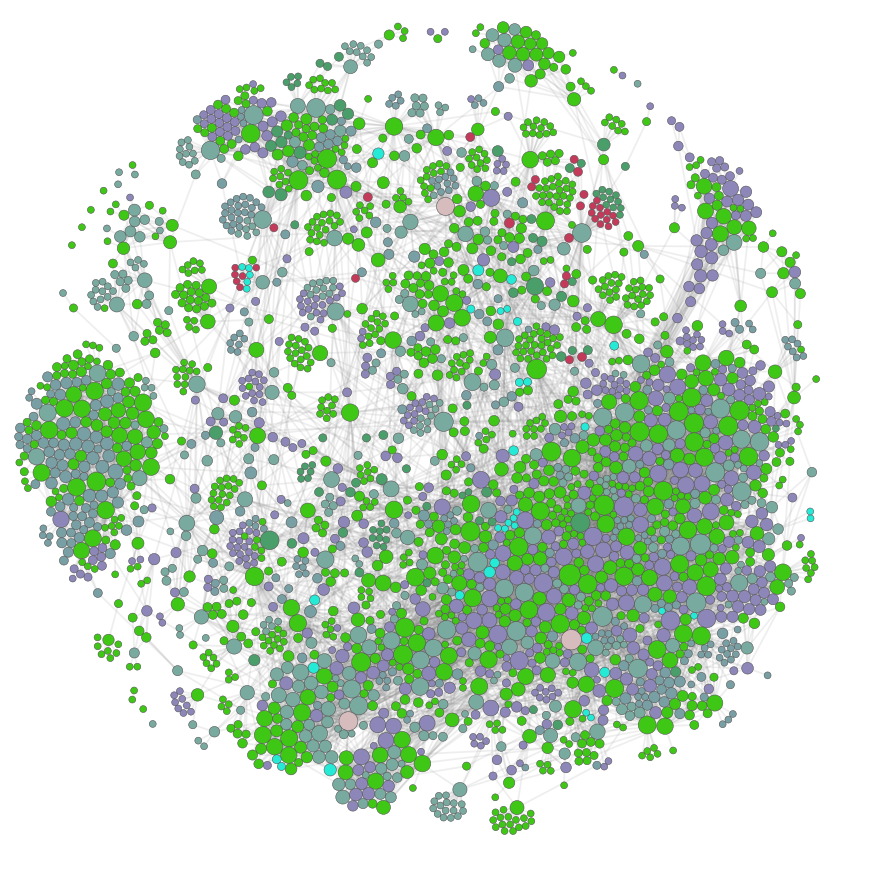

In [388]:
fig, ax = nw.draw_netwulf(stylized_network, figsize=12)

In [118]:
network = nw.get_filtered_network(G2,node_group_key='price')
stylized_network, config = nw.visualize(network, plot_in_cell_below=False)

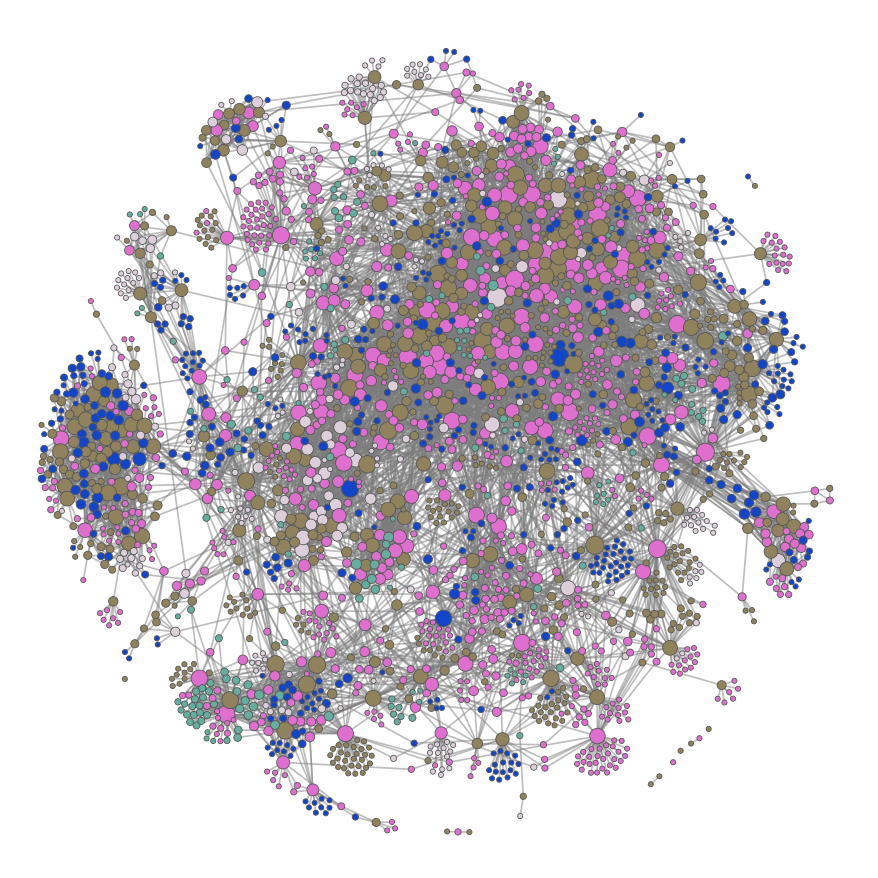

In [113]:
fig, ax = nw.draw_netwulf(stylized_network, figsize=12)

In [491]:
network = nw.get_filtered_network(G3, node_group_key="category")
stylized_network, config = nw.visualize(network, plot_in_cell_below=False)

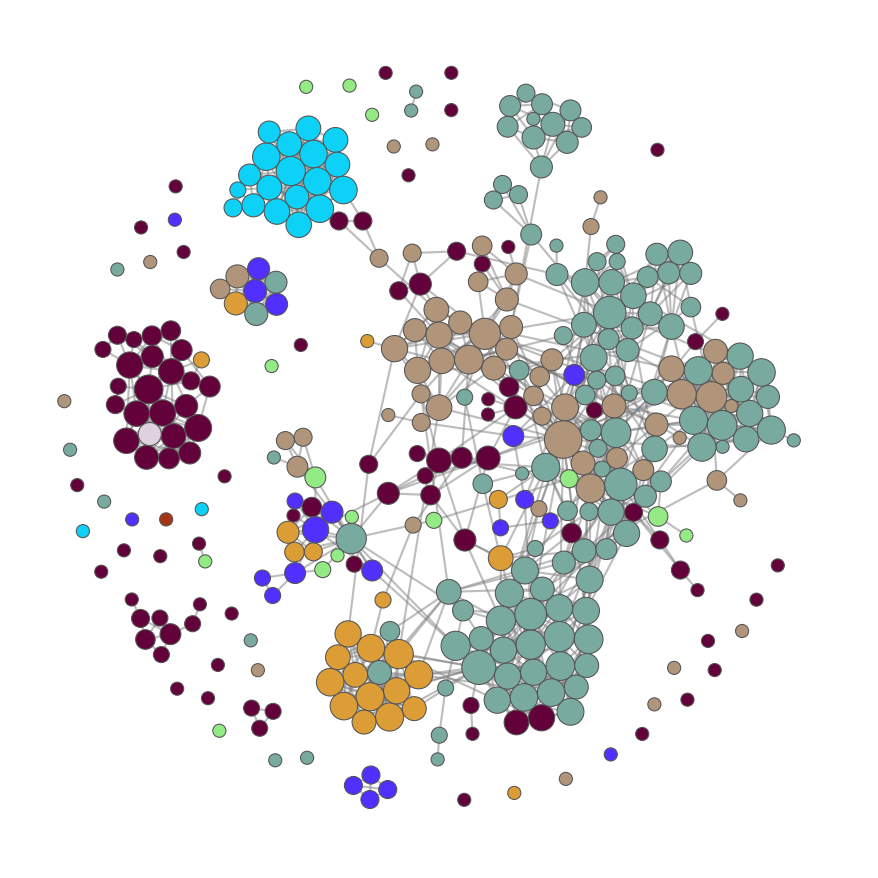

In [492]:
fig, ax = nw.draw_netwulf(stylized_network, figsize=12)

The nodes are grouped by price range, sorted into 4 bins

In [146]:
#light pink
print(price['B00EKLPLU4'])
#brown
print(price['B0019GZ87Y'])
#blue
print(price['B000EITYUU'])
#pink
print(price['B000EA3M92'])
#green
print(price['B001FY0GMC'])




0-5
10-20
20-50
5-10
>50


In [458]:
product_df3_copy = product_df3.copy()

product_df3_copy.set_index("asin", inplace = True)


In [463]:
product_df3_copy.loc['B000EITYUU']

,description,title,imUrl,related,salesRank,categories,price,brand,related_products
asin,,,,,,,,,
B000EITYUU,Celtic Sea Salt Fine Ground is the same type ...,"Celtic Sea Salt, Fine Ground, 16 Ounce",http://ecx.images-amazon.com/images/I/51T6jxhN...,"{'also_bought': ['B000SWTKV0', 'B000SWVKAE', '...",{'Grocery & Gourmet Food': 439},"[['Grocery & Gourmet Food', 'Canned, Dry & Pac...",13.5,Celtic Sea Salt,B000SWTKV0
B000EITYUU,Celtic Sea Salt Fine Ground is the same type ...,"Celtic Sea Salt, Fine Ground, 16 Ounce",http://ecx.images-amazon.com/images/I/51T6jxhN...,"{'also_bought': ['B000SWTKV0', 'B000SWVKAE', '...",{'Grocery & Gourmet Food': 439},"[['Grocery & Gourmet Food', 'Canned, Dry & Pac...",13.5,Celtic Sea Salt,B000SWVKAE
B000EITYUU,Celtic Sea Salt Fine Ground is the same type ...,"Celtic Sea Salt, Fine Ground, 16 Ounce",http://ecx.images-amazon.com/images/I/51T6jxhN...,"{'also_bought': ['B000SWTKV0', 'B000SWVKAE', '...",{'Grocery & Gourmet Food': 439},"[['Grocery & Gourmet Food', 'Canned, Dry & Pac...",13.5,Celtic Sea Salt,B000TIZP5I
B000EITYUU,Celtic Sea Salt Fine Ground is the same type ...,"Celtic Sea Salt, Fine Ground, 16 Ounce",http://ecx.images-amazon.com/images/I/51T6jxhN...,"{'also_bought': ['B000SWTKV0', 'B000SWVKAE', '...",{'Grocery & Gourmet Food': 439},"[['Grocery & Gourmet Food', 'Canned, Dry & Pac...",13.5,Celtic Sea Salt,B0006ZN538
B000EITYUU,Celtic Sea Salt Fine Ground is the same type ...,"Celtic Sea Salt, Fine Ground, 16 Ounce",http://ecx.images-amazon.com/images/I/51T6jxhN...,"{'also_bought': ['B000SWTKV0', 'B000SWVKAE', '...",{'Grocery & Gourmet Food': 439},"[['Grocery & Gourmet Food', 'Canned, Dry & Pac...",13.5,Celtic Sea Salt,B0095FWPZE
...,...,...,...,...,...,...,...,...,...
B000EITYUU,Celtic Sea Salt Fine Ground is the same type ...,"Celtic Sea Salt, Fine Ground, 16 Ounce",http://ecx.images-amazon.com/images/I/51T6jxhN...,"{'also_bought': ['B000SWTKV0', 'B000SWVKAE', '...",{'Grocery & Gourmet Food': 439},"[['Grocery & Gourmet Food', 'Canned, Dry & Pac...",13.5,Celtic Sea Salt,B004OVWQDA
B000EITYUU,Celtic Sea Salt Fine Ground is the same type ...,"Celtic Sea Salt, Fine Ground, 16 Ounce",http://ecx.images-amazon.com/images/I/51T6jxhN...,"{'also_bought': ['B000SWTKV0', 'B000SWVKAE', '...",{'Grocery & Gourmet Food': 439},"[['Grocery & Gourmet Food', 'Canned, Dry & Pac...",13.5,Celtic Sea Salt,B00014JNI0
B000EITYUU,Celtic Sea Salt Fine Ground is the same type ...,"Celtic Sea Salt, Fine Ground, 16 Ounce",http://ecx.images-amazon.com/images/I/51T6jxhN...,"{'also_bought': ['B000SWTKV0', 'B000SWVKAE', '...",{'Grocery & Gourmet Food': 439},"[['Grocery & Gourmet Food', 'Canned, Dry & Pac...",13.5,Celtic Sea Salt,B0006ZN538


In [193]:
product_df3_copy.loc['B00473P6PA']


,description,title,imUrl,related,salesRank,categories,price,brand,related_products
asin,,,,,,,,,
B00473P6PA,Herb-Ox bouillon is made with real bouillon co...,"Herbox Granular Sodium Free Chicken Bouillon, ...",http://ecx.images-amazon.com/images/I/51FZWFxs...,"{'also_bought': ['B00473P4X4', 'B002HQGF4A', '...",{'Grocery & Gourmet Food': 10215},[['Grocery & Gourmet Food']],31.5,Herb-Ox,B00473P4X4
B00473P6PA,Herb-Ox bouillon is made with real bouillon co...,"Herbox Granular Sodium Free Chicken Bouillon, ...",http://ecx.images-amazon.com/images/I/51FZWFxs...,"{'also_bought': ['B00473P4X4', 'B002HQGF4A', '...",{'Grocery & Gourmet Food': 10215},[['Grocery & Gourmet Food']],31.5,Herb-Ox,B002HQGF4A
B00473P6PA,Herb-Ox bouillon is made with real bouillon co...,"Herbox Granular Sodium Free Chicken Bouillon, ...",http://ecx.images-amazon.com/images/I/51FZWFxs...,"{'also_bought': ['B00473P4X4', 'B002HQGF4A', '...",{'Grocery & Gourmet Food': 10215},[['Grocery & Gourmet Food']],31.5,Herb-Ox,B002HQKID4
B00473P6PA,Herb-Ox bouillon is made with real bouillon co...,"Herbox Granular Sodium Free Chicken Bouillon, ...",http://ecx.images-amazon.com/images/I/51FZWFxs...,"{'also_bought': ['B00473P4X4', 'B002HQGF4A', '...",{'Grocery & Gourmet Food': 10215},[['Grocery & Gourmet Food']],31.5,Herb-Ox,B0009XQRUK
B00473P6PA,Herb-Ox bouillon is made with real bouillon co...,"Herbox Granular Sodium Free Chicken Bouillon, ...",http://ecx.images-amazon.com/images/I/51FZWFxs...,"{'also_bought': ['B00473P4X4', 'B002HQGF4A', '...",{'Grocery & Gourmet Food': 10215},[['Grocery & Gourmet Food']],31.5,Herb-Ox,B000LKZ9Q4
B00473P6PA,Herb-Ox bouillon is made with real bouillon co...,"Herbox Granular Sodium Free Chicken Bouillon, ...",http://ecx.images-amazon.com/images/I/51FZWFxs...,"{'also_bought': ['B00473P4X4', 'B002HQGF4A', '...",{'Grocery & Gourmet Food': 10215},[['Grocery & Gourmet Food']],31.5,Herb-Ox,B006GCMI5Q
B00473P6PA,Herb-Ox bouillon is made with real bouillon co...,"Herbox Granular Sodium Free Chicken Bouillon, ...",http://ecx.images-amazon.com/images/I/51FZWFxs...,"{'also_bought': ['B00473P4X4', 'B002HQGF4A', '...",{'Grocery & Gourmet Food': 10215},[['Grocery & Gourmet Food']],31.5,Herb-Ox,B00473DRME
B00473P6PA,Herb-Ox bouillon is made with real bouillon co...,"Herbox Granular Sodium Free Chicken Bouillon, ...",http://ecx.images-amazon.com/images/I/51FZWFxs...,"{'also_bought': ['B00473P4X4', 'B002HQGF4A', '...",{'Grocery & Gourmet Food': 10215},[['Grocery & Gourmet Food']],31.5,Herb-Ox,B002W5SDEQ
B00473P6PA,Herb-Ox bouillon is made with real bouillon co...,"Herbox Granular Sodium Free Chicken Bouillon, ...",http://ecx.images-amazon.com/images/I/51FZWFxs...,"{'also_bought': ['B00473P4X4', 'B002HQGF4A', '...",{'Grocery & Gourmet Food': 10215},[['Grocery & Gourmet Food']],31.5,Herb-Ox,B001BM3CE2


These bins are  arbitrarily decided. One interesting point with this network is the nodes at the edges with many smaller nodes connected only to it. One such product is "B001SB4OV6" which is in the 5-10 dollar price range. One of its related products has the ID B003ZTPXNM.

We can also take a look at the price bins as communities. We dont expect them to perform very well, as the graph is not particularly organised by color. 

In [364]:
import numpy as np
import community as community_louvain
import matplotlib.pyplot as plt
from networkx.readwrite import json_graph

#first compute the best partition
partition = community_louvain.best_partition(G)

# number of communities in the partition
len(np.unique(list(partition.values())))


31

In [365]:
import numpy as np
import community as community_louvain
import matplotlib.pyplot as plt
from networkx.readwrite import json_graph

#first compute the best partition
partition2 = community_louvain.best_partition(G2)

# number of communities in the partition
len(np.unique(list(partition2.values())))


26

In [464]:
import numpy as np
import community as community_louvain
import matplotlib.pyplot as plt
from networkx.readwrite import json_graph

#first compute the best partition
partition3 = community_louvain.best_partition(G3)

# number of communities in the partition
len(np.unique(list(partition3.values())))


69

In [465]:
def computeModularity(G, partition):

    partitions = np.unique(list(nx.get_node_attributes(G,partition).values()))
    partition_dic = {part: [] for part in partitions}
    
    N = len(G.nodes())
    L = len(G.edges())
    
    modularity = 0
    for key in partition_dic.keys():
        for node in G.nodes():
            part = G.nodes[node][partition]
            partition_dic[part].append(node)
        community = nx.Graph.subgraph(G, partition_dic[key])
        k_c = sum([G.degree(v) for v in community])
        L_c = len(community.edges())


        modularity += (L_c / L) - (k_c/(2*L))**2
        
    return modularity

In [366]:
print("modularity of category partition:", computeModularity(G, 'category'))
H = G.copy()
nx.set_node_attributes(H, partition, 'Louvain')

modularity = computeModularity(H, 'Louvain')
print("The modularity of the louvain split network is:", modularity)

modularity of category partition: -0.022179029789698285
The modularity of the louvain split network is: 0.6667179088016834


In [367]:
network = nw.get_filtered_network(H, node_group_key="Louvain")
stylized_network, config = nw.visualize(network, plot_in_cell_below=False)

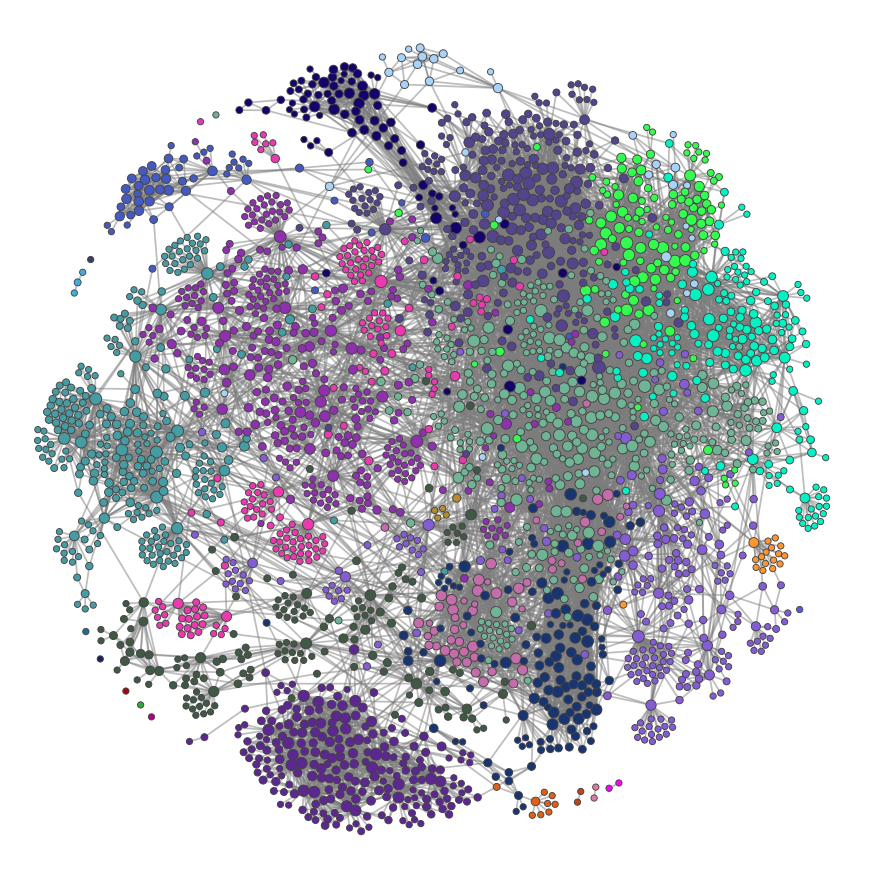

In [368]:
fig, ax = nw.draw_netwulf(stylized_network, figsize=12)

In [369]:
print("modularity of price partition:", computeModularity(G2, 'price'))
H2 = G2.copy()
nx.set_node_attributes(H2, partition2, 'Louvain')

modularity = computeModularity(H2, 'Louvain')
print("The modularity of the louvain split network is:", modularity)

modularity of category partition: -0.018620834419208088
The modularity of the louvain split network is: 0.6667179088016834


In [127]:
network = nw.get_filtered_network(H2, node_group_key="Louvain")
stylized_network, config = nw.visualize(network, plot_in_cell_below=False)

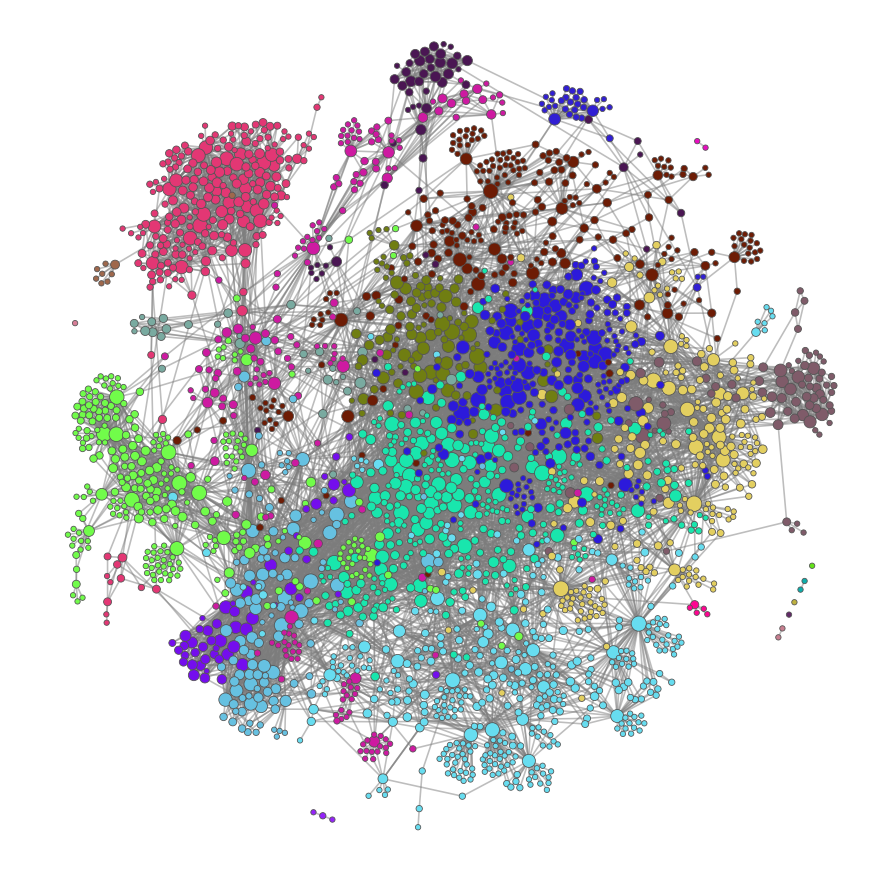

In [128]:
fig, ax = nw.draw_netwulf(stylized_network, figsize=12)

In [503]:
print("modularity of small category partition:", computeModularity(G3, 'category'))
H3 = G3.copy()
nx.set_node_attributes(H3, partition3, 'Louvain')

modularity = computeModularity(H3, 'Louvain')
print("The modularity of the louvain split network is:", modularity)

modularity of small category partition: 0.46963262063093614
The modularity of the louvain split network is: 0.7600551775517095


In [504]:
network = nw.get_filtered_network(H3, node_group_key="Louvain")
stylized_network, config = nw.visualize(network, plot_in_cell_below=False)

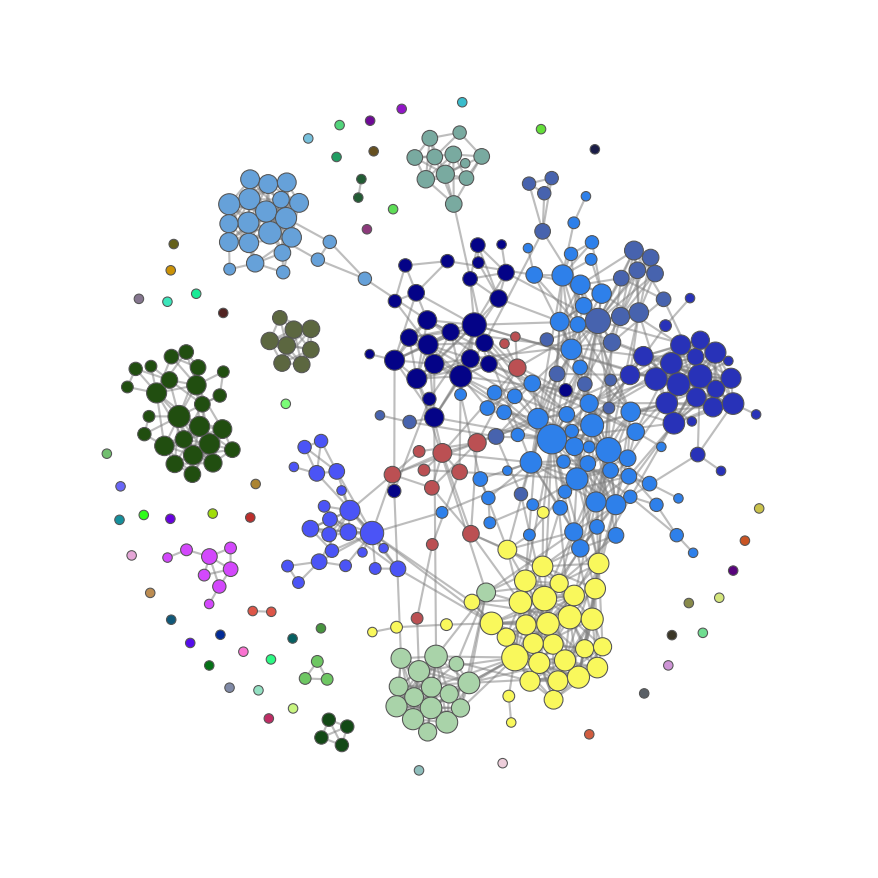

In [376]:
fig, ax = nw.draw_netwulf(stylized_network, figsize=12)

In [505]:
len(np.unique(list(nx.get_node_attributes(H3,'Louvain').values())))

69

In [508]:
print(np.unique(list(nx.get_node_attributes(G3,'category').values())))

['Baby Foods' 'Beverages' 'Breakfast Foods' 'Candy & Chocolate' 'Canned'
 'Cooking & Baking' 'Fresh Flowers & Live Indoor Plants' 'Gourmet Gifts'
 'Snack Foods']


<AxesSubplot:>

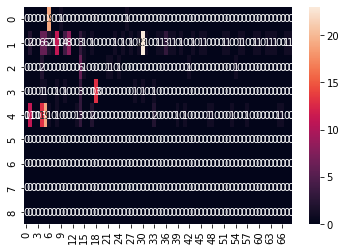

In [509]:
D = np.zeros([9,69])
cats = list(np.unique(list(nx.get_node_attributes(G3,'category').values())))
OG_dict = nx.get_node_attributes(G3, 'category')
for i in range(5):
    nodes = set([k for k in range(len(G3.nodes())) if nx.get_node_attributes(G3,'category')[list(G3.nodes())[k]] == cats[i]])
    for j in range(69):
        nodes2 = set([k for k in range(len(H3.nodes())) if nx.get_node_attributes(H3,'Louvain')[list(H3.nodes())[k]] == j])        
        D[i,j] = len(nodes2.intersection(nodes))

import seaborn as sns
sns.heatmap(D, annot=True)

In [510]:
nx.get_node_attributes(H3,'Louvain')[list(H3.nodes())[301]]
# np.unique(list(nx.get_node_attributes(H3,'Louvain').values()))

60

***Remove singleton from small network***

In [537]:
G4 = G3.copy()
for node in list(G4.nodes()):
    if list(G4.edges(node)) == []:
        G4.remove_node(node)
print(len(G4.nodes()))

306


In [512]:

#first compute the best partition
partition4 = community_louvain.best_partition(G4)

# number of communities in the partition
len(np.unique(list(partition4.values())))


17

In [536]:
print("modularity of category partition:", computeModularity(G4, 'category'))
H4 = G4.copy()
nx.set_node_attributes(H4, partition4, 'Louvain')

modularity = computeModularity(H4, 'Louvain')
print("The modularity of the louvain split network is:", modularity)

modularity of category partition: 0.46963262063093614
The modularity of the louvain split network is: 0.7582339697009732


In [514]:
network = nw.get_filtered_network(G4, node_group_key="category")
stylized_network, config = nw.visualize(network, plot_in_cell_below=False)

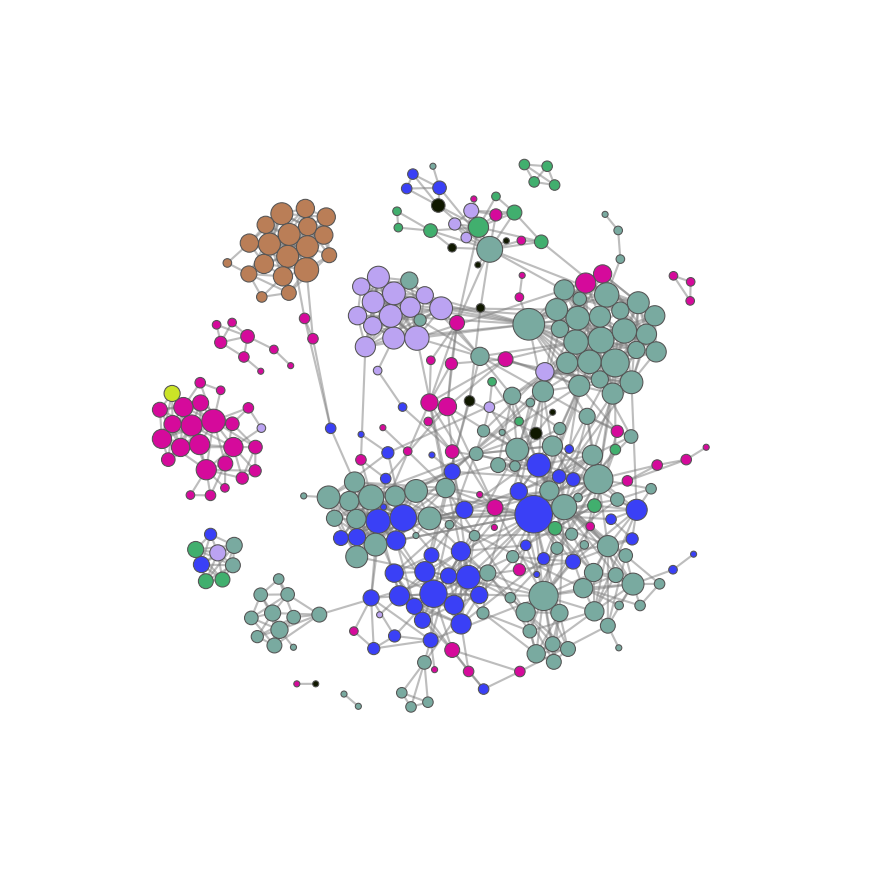

In [515]:
fig, ax = nw.draw_netwulf(stylized_network, figsize=12)

In [330]:
network = nw.get_filtered_network(H4, node_group_key="Louvain")
stylized_network, config = nw.visualize(network, plot_in_cell_below=False)

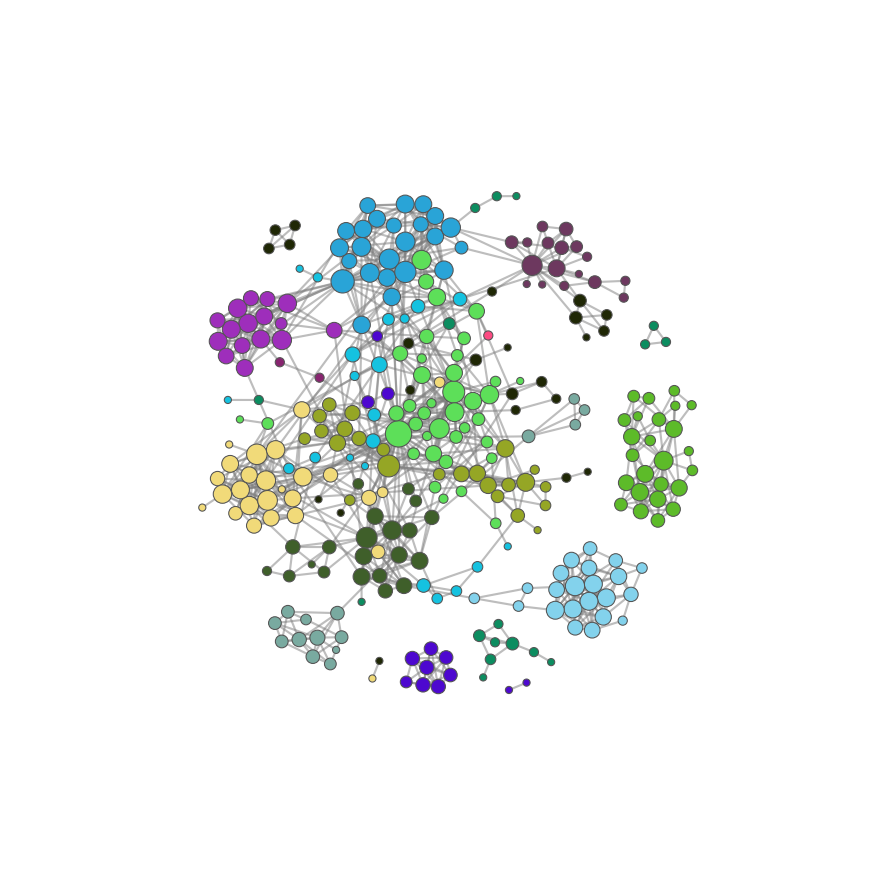

In [331]:
fig, ax = nw.draw_netwulf(stylized_network, figsize=12)

In [521]:
len(np.unique(list(nx.get_node_attributes(G4,'category').values())))

8

In [ ]:
D = np.zeros([8,17])
cats = list(np.unique(list(nx.get_node_attributes(G4,'category').values())))
OG_dict = nx.get_node_attributes(G4, 'category')
for i in range(8):
    nodes = set([k for k in range(len(G4.nodes())) if nx.get_node_attributes(G4,'category')[list(G4.nodes())[k]] == cats[i]])
    for j in range(17):
        nodes2 = set([k for k in range(len(H4.nodes())) if nx.get_node_attributes(H4,'Louvain')[list(H4.nodes())[k]] == j])        
        D[i,j] = len(nodes2.intersection(nodes))

[Text(0, 0.5, 'Baby Foods'),
 Text(0, 1.5, 'Beverages'),
 Text(0, 2.5, 'Breakfast Foods'),
 Text(0, 3.5, 'Candy & Chocolate'),
 Text(0, 4.5, 'Canned'),
 Text(0, 5.5, 'Cooking & Baking'),
 Text(0, 6.5, 'Gourmet Gifts'),
 Text(0, 7.5, 'Snack Foods')]

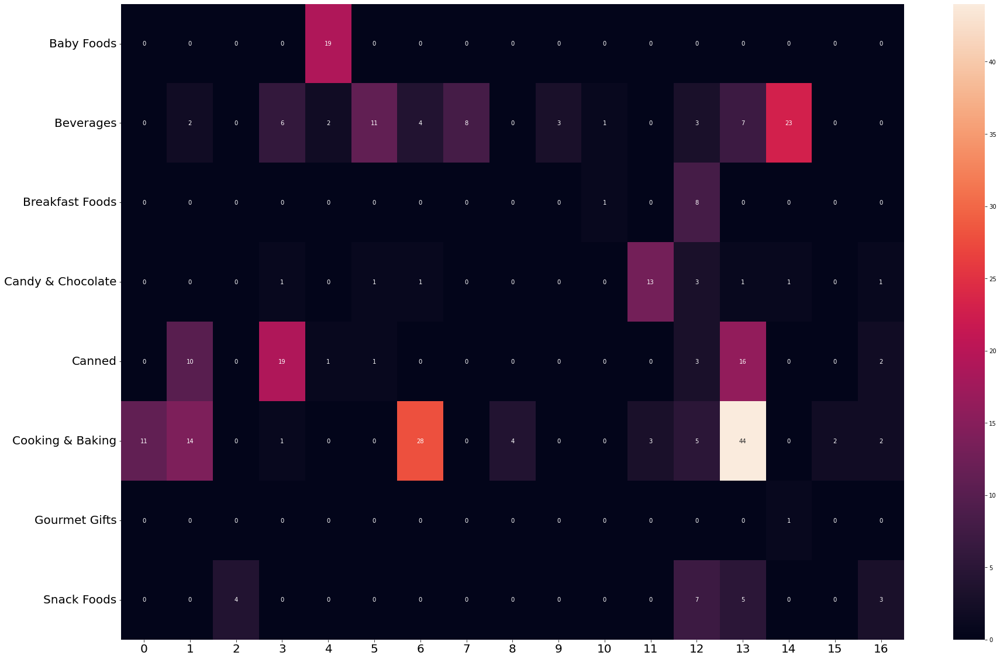

In [535]:
import seaborn as sns
plt.figure(figsize = (30,20))

ax = sns.heatmap(D, annot=True)
ax.set_xticklabels(range(17),size=20,rotation=0)
ax.set_yticklabels(np.unique(list(nx.get_node_attributes(G4,'category').values())),size=20,rotation=0)

# Reviewer/edge network

# Sentiment analysis

In [343]:
Counter(list(product_df5['category']))

Counter({'Cooking & Baking': 5224,
         'Beverages': 2735,
         'Snack Foods': 1107,
         'Fresh Flowers & Live Indoor Plants': 3,
         'Canned': 2653,
         'Breakfast Foods': 523,
         'Baby Foods': 230,
         'Candy & Chocolate': 1042,
         'Gourmet Gifts': 29})

In [40]:
product_df2 = pd.read_csv("data/product_df2.csv")

In [41]:
product_df2

,asin,description,title,imUrl,related,salesRank,categories,price,brand
0,616719923X,Green Tea Flavor Kit Kat have quickly become t...,Japanese Kit Kat Maccha Green Tea Flavor (5 Ba...,http://ecx.images-amazon.com/images/I/51LdEao6...,"{'also_bought': ['B00FD63L5W', 'B0047YG5UY', '...",{'Grocery & Gourmet Food': 37305},[['Grocery & Gourmet Food']],NaN,NaN
1,9742356831,Used to make various curry soups and stir fry ...,Mae Ploy Thai Green Curry Paste - 14 oz jar,http://ecx.images-amazon.com/images/I/41pQp67A...,"{'also_bought': ['B000EI2LLO', 'B000EICISA', '...",{'Grocery & Gourmet Food': 3434},[['Grocery & Gourmet Food']],7.23,Mae Ploy
2,B00004S1C5,"From Easter eggs to colorful cookies, Spectrum...","Ateco Food Coloring Kit, 6 colors",http://ecx.images-amazon.com/images/I/41F75K9F...,"{'also_bought': ['B0000CFMLT', 'B002PO3KBK', '...",{'Kitchen & Dining': 4494},"[['Grocery & Gourmet Food', 'Cooking & Baking'...",9.76,HIC Harold Import Co.
3,B0000531B7,NaN,"PowerBar Harvest Energy Bars, Double Chocolate...",http://ecx.images-amazon.com/images/I/519SuVj1...,"{'also_bought': ['B000EC63PU', 'B00DZGEY44', '...",{'Grocery & Gourmet Food': 2858},[['Grocery & Gourmet Food']],24.75,Powerbar
4,B00005344V,"For nearly forty years, we&#x2019;ve been pass...","Traditional Medicinals Breathe Easy, 16-Count ...",http://ecx.images-amazon.com/images/I/51H54cd-...,"{'also_bought': ['B0009F3POE', 'B0009F3POO', '...",{'Grocery & Gourmet Food': 5034},[['Grocery & Gourmet Food']],21.74,Traditional Medicinals
...,...,...,...,...,...,...,...,...,...
8451,B00JGPG60I,Enfamil Reguline is an everyday formula that g...,Enfamil Reguline Milk-Based Powder with Iron I...,http://ecx.images-amazon.com/images/I/510zYVQ8...,"{'also_bought': ['B003VKYGOM', 'B00CTKKB1C', '...",{'Health & Personal Care': 13464},"[['Grocery & Gourmet Food', 'Baby Foods', 'Bab...",16.00,Enfamil
8452,B00JL6LTMW,The street corners of big cities are sprinkled...,"Larabar Renola Grain-Free Granola, Cinnamon Nu...",http://ecx.images-amazon.com/images/I/4114WeHd...,"{'also_bought': ['B00BCNTCHG', '1628600101', '...",{'Grocery & Gourmet Food': 9344},[['Grocery & Gourmet Food']],26.02,NaN
8453,B00K00H9I6,Harvested from the iconic snowy woods of Quebe...,Canadian Finest Maple Syrup - 100% Pure Certif...,http://ecx.images-amazon.com/images/I/41abh7Ho...,"{'also_bought': ['B005P0LW66', 'B00JEKYNZA', '...",{'Grocery & Gourmet Food': 1500},[['Grocery & Gourmet Food']],18.95,NaN
8454,B00KC0LGI8,NaN,"Betty Crocker Dry Meals Suddenly Grain Salad, ...",http://ecx.images-amazon.com/images/I/61zqxqJi...,"{'also_viewed': ['B00KSKIHVG', 'B00JWWM1T0', '...",{'Grocery & Gourmet Food': 97624},[['Grocery & Gourmet Food']],NaN,NaN


In [43]:
# remove indices with no subcategories
idx = []
# subcategories
categories = []
for i in range(len(product_df2)):
    if str(product_df2.iloc[i]['categories']) == str([['Grocery & Gourmet Food']]):
        idx.append(i)
    else:
        h = product_df2.iloc[i]['categories']
        h = h.replace("[","").replace("]","").replace(" '","").replace("'", "")
        h = h.split(",")
        
        categories.append(h[1])

In [52]:
# remove indices in original df
product_df6 = product_df2.drop(idx)
# make a new column
product_df7 = product_df6.assign(category=categories)
product_df7.to_csv("data/product_df7.csv", index=False)

In [56]:
print("Amount of products with subcategories: ", len(product_df7))

amount of products with subcategories:  358


In [95]:
review_df['text'] = review_df['reviewText'] + ' ' + review_df['summary']

,reviewerID,asin,reviewerName,helpful,reviewText,overall,summary,unixReviewTime,reviewTime,text
0,A1VEELTKS8NLZB,616719923X,Amazon Customer,"[0, 0]",Just another flavor of Kit Kat but the taste i...,4.0,Good Taste,1370044800,"06 1, 2013",Just another flavor of Kit Kat but the taste i...
1,A14R9XMZVJ6INB,616719923X,amf0001,"[0, 1]",I bought this on impulse and it comes from Jap...,3.0,"3.5 stars, sadly not as wonderful as I had hoped",1400457600,"05 19, 2014",I bought this on impulse and it comes from Jap...
2,A27IQHDZFQFNGG,616719923X,Caitlin,"[3, 4]",Really good. Great gift for any fan of green t...,4.0,Yum!,1381190400,"10 8, 2013",Really good. Great gift for any fan of green t...
3,A31QY5TASILE89,616719923X,DebraDownSth,"[0, 0]","I had never had it before, was curious to see ...",5.0,Unexpected flavor meld,1369008000,"05 20, 2013","I had never had it before, was curious to see ..."
4,A2LWK003FFMCI5,616719923X,Diana X.,"[1, 2]",I've been looking forward to trying these afte...,4.0,"Not a very strong tea flavor, but still yummy ...",1369526400,"05 26, 2013",I've been looking forward to trying these afte...
...,...,...,...,...,...,...,...,...,...,...
151249,A2L6QS8SVHT9RG,B00KCJRVO2,"randomartco ""period film aficionado""","[0, 0]",Delicious gluten-free oatmeal: we tried both t...,4.0,Delicious gluten-free oatmeal 'quick' packs!,1405123200,"07 12, 2014",Delicious gluten-free oatmeal: we tried both t...
151250,AFJFXN42RZ3G2,B00KCJRVO2,"R. DelParto ""Rose2""","[0, 0]",With the many selections of instant oatmeal ce...,4.0,Convenient and Instant,1404604800,"07 6, 2014",With the many selections of instant oatmeal ce...
151251,ASEBX8TBYWQWA,B00KCJRVO2,"Steven I. Ramm ""Steve Ramm &#34;Anything Phon...","[1, 1]","While I usually review CDs and DVDs, as well a...",5.0,Compares favorably in taste and texture with o...,1404172800,"07 1, 2014","While I usually review CDs and DVDs, as well a..."
151252,ANKQGTXHREOI5,B00KCJRVO2,Titanium Lili,"[0, 1]",My son and I enjoyed these oatmeal packets. H...,4.0,Pretty good!,1404432000,"07 4, 2014",My son and I enjoyed these oatmeal packets. H...


In [98]:
review_df['text'][1]

"I bought this on impulse and it comes from Japan,  which amused my family,  all those weird stamps and markings on the package. So that was fun.  It said it would take about a month to arrive and it did take that long.  I was hoping for a more interesting taste but to our family,  it just tasted a bit less flavorful or weaker than the standard milk chocolate kit kat.  The green tea flavor was too subtle for the sugar and it just tasted sweet. The wafers were very crispy, and that was good,  but it tasted a bit anemic to us.I'm happy I bought it, but don't need to buy it again. 3.5 stars,  sadly not as wonderful as I had hoped"

In [161]:
# # # clean the text:
# &#34 = quotation mark
# / remove all
# add space after ! and .


# tokenise text
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords

stopwords = stopwords.words('english')
alphabet = "abcdefghijklmnopqrstuvwxyz"
# URL1 = '.com'
# URL2 = 'www.'
# URL3 = 'https'
# URL4 = '='
# URL5 = '.'
# char1 = 'amp' # a part of "&amp" which means ampersand in HTML
# char2 = 'x200b' # character code for zero width space
# char3 = 'gt' # greater than
# char4 = 'lt' # less than


all_reviews = []
for text in review_df['text']:
    tokens = word_tokenize(text)
    review = []
    for token in tokens:
        token = token.lower()
        # remove stopwords, punctuation and numbers
        if token not in stopwords and token[0] in alphabet and token[-1] in alphabet:
            # remove URLs
            review.append(token)
    all_reviews.append(review)

review_df['tokens'] = all_reviews

In [166]:
review_df.iloc[0]['tokens']

['another',
 'flavor',
 'kit',
 'kat',
 'taste',
 'unique',
 'bit',
 'different',
 'thing',
 'bothersome',
 'price',
 'thought',
 'bit',
 'expensive',
 'good',
 'taste']

In [167]:
prod_dict = {}
for product in product_df7['asin']:
    prod_dict[product] = []
    
for i in range(len(review_df)):
    prod = review_df.iloc[i]['asin']
    if prod in prod_dict:
        review = review_df.iloc[i]['tokens']
        prod_dict[prod].extend(review)

In [168]:
prod_dict[product_df7['asin'].iloc[0]]

['dyes',
 'create',
 'awesome',
 'colors',
 'kids',
 'crafts',
 'used',
 'make',
 'finger',
 'paint',
 'paint',
 'play',
 'dough',
 'salt',
 'dough.another',
 'reviewer',
 'stated',
 'natural',
 'correct',
 'definitely',
 'artificial',
 'dyes',
 'tried',
 'making',
 'dyes',
 'fell',
 'worked',
 'great',
 'pinch',
 'need',
 'couple',
 'drops',
 'really',
 'vibrant',
 'color',
 'pretty',
 'easy',
 'clean',
 "n't",
 'stain',
 'made',
 'whatever',
 'craft.good',
 'product',
 'price',
 'great',
 'kids',
 'crafts',
 'product',
 'near',
 'natural',
 'organic-i',
 'wish',
 'seen',
 'reviews',
 'purchasing',
 'contains',
 'things',
 'want-which',
 'looking',
 'natural',
 'alternative',
 'need',
 'ingredient',
 'list',
 'avoid',
 'returning',
 'item',
 'trying',
 'avoid',
 'children',
 'exposure',
 'yellow',
 'red',
 'understand',
 'still',
 'make',
 'things',
 'knowing',
 'cause',
 'may',
 'fine',
 'someone',
 "n't",
 'read',
 'labels',
 'care',
 'kids',
 'eat-but',
 'family',
 'natural/organic

In [170]:
cat_dict = {}
for cat in np.unique(categories):
    cat_dict[cat] = []

for prod in prod_dict.keys():
    cat = product_df7.iloc[np.where(product_df7['asin']==prod)]['category'].iloc[0]
    cat_dict[cat].extend(prod_dict[prod])

In [176]:
for key in cat_dict.keys():
    print('N tokens, {0}: {1}'.format(key, len(cat_dict[key])))

N tokens, Baby Foods: 37730
N tokens, Beverages: 72767
N tokens, Breakfast Foods: 7766
N tokens, Candy & Chocolate: 8798
N tokens, Canned: 45528
N tokens, Cooking & Baking: 85302
N tokens, Fresh Flowers & Live Indoor Plants: 257
N tokens, Gourmet Gifts: 246
N tokens, Snack Foods: 12227


In [179]:
for key in cat_dict.keys():
    print("Category:", key)
    a = dict(Counter(cat_dict[key],sorted=True))
    print(sorted(a, key=a.get, reverse=True)[:5])
    counts = sorted(a.values(), reverse=True)[:5]
    tf = [count/len(cat_dict[key]) for count in counts]
    print(np.round(tf,3))
    print("\n")

Category: Baby Foods
['formula', 'milk', "n't", 'baby', 'like']
[0.029 0.014 0.014 0.013 0.009]


Category: Beverages
['tea', "n't", 'like', 'good', 'coffee']
[0.026 0.013 0.012 0.011 0.01 ]


Category: Breakfast Foods
['bars', 'bar', 'like', 'good', "n't"]
[0.025 0.02  0.019 0.015 0.015]


Category: Candy & Chocolate
['gum', 'flavor', 'good', "n't", 'great']
[0.033 0.019 0.015 0.014 0.014]


Category: Canned
['salt', "n't", 'taste', 'good', 'like']
[0.016 0.012 0.01  0.01  0.01 ]


Category: Cooking & Baking
['oil', 'coconut', 'use', "n't", 'like']
[0.014 0.012 0.011 0.011 0.01 ]


Category: Fresh Flowers & Live Indoor Plants
['tree', 'nice', 'light', 'bonsai', 'ficus']
[0.054 0.019 0.019 0.019 0.016]


Category: Gourmet Gifts
['love', 'cups', 'looks', 'coffee', 'holds']
[0.028 0.024 0.024 0.02  0.02 ]


Category: Snack Foods
['fruit', 'like', 'good', 'great', "n't"]
[0.019 0.014 0.014 0.012 0.012]




In [185]:
# Make IDF dict
document_freq_dic = {}
IDF = {}
N = len(cat_dict)
for key in cat_dict.keys():
    print("Category:",key)
    unique_term = np.unique(cat_dict[key])
    for t in unique_term:
        if t not in document_freq_dic.keys():
            document_freq_dic[t] = 0
        document_freq_dic[t] += 1
        IDF[t] = np.log(N/document_freq_dic[t])
        
        
df_document_freq = pd.DataFrame.from_dict(document_freq_dic, orient='index', columns=['doc_freq'])
df_document_freq.to_csv("document_freq.csv")

df_idf = pd.DataFrame.from_dict(IDF, orient='index', columns=['IDF'])
df_idf.to_csv("IDF.csv")

Category: Baby Foods
Category: Beverages
Category: Breakfast Foods
Category: Candy & Chocolate
Category: Canned
Category: Cooking & Baking
Category: Fresh Flowers & Live Indoor Plants
Category: Gourmet Gifts
Category: Snack Foods


In [187]:
IDF_df = pd.read_csv("IDF.csv", index_col=0)
IDF_df

,IDF
a.r,1.504077
abbreviated,2.197225
abdominal,1.098612
ability,0.587787
able,0.117783
...,...
young-at-heart,2.197225
yourtypical,2.197225
yummmmm,2.197225
z-bars,2.197225


In [190]:
for key in cat_dict.keys():
    unique_terms = np.unique(cat_dict[key])
    TF_IDF = {}
    # top 10 TF for each stock
    print("Category:", key)
    print("Top 10 TF words")
    a = dict(Counter(cat_dict[key],sorted=True))
    print(sorted(a, key=a.get, reverse=True)[:10])
    counts = sorted(a.values(), reverse=True)[:10]
    tf = [count/len(cat_dict[key]) for count in counts]
    print(np.round(tf,3))


    # top 10 TF-IDF for each stock
    for t in unique_terms:
        if t in IDF_df.index:
            tf = a[t]/len(cat_dict[key])
            TF_IDF[t] = IDF_df['IDF'][t] * tf
    print("Top 10 TF-IDF words")
    print(sorted(TF_IDF, key=TF_IDF.get, reverse=True)[:10])
    b = sorted(TF_IDF.values(), reverse=True)[:10]
    print(np.round(b,3))
    print("\n")

Category: Baby Foods
Top 10 TF words
['formula', 'milk', "n't", 'baby', 'like', 'enfamil', 'corn', 'good', 'syrup', 'one']
[0.029 0.014 0.014 0.013 0.009 0.009 0.008 0.008 0.008 0.008]
Top 10 TF-IDF words
['formula', 'enfamil', 'baby', 'infant', 'enfagrow', 'milk', 'formulas', 'transitions', 'toddler', 'solids']
[0.023 0.014 0.008 0.007 0.006 0.006 0.006 0.004 0.004 0.004]


Category: Beverages
Top 10 TF words
['tea', "n't", 'like', 'good', 'coffee', 'taste', 'one', 'flavor', 'green', 'great']
[0.026 0.013 0.012 0.011 0.01  0.009 0.008 0.008 0.008 0.008]
Top 10 TF-IDF words
['tea', 'pads', 'pad', 'keurig', 'teas', 'cooktop', 'scotch-brite', 'taste', 'drink', 'tazo']
[0.015 0.006 0.003 0.003 0.003 0.003 0.002 0.002 0.002 0.002]


Category: Breakfast Foods
Top 10 TF words
['bars', 'bar', 'like', 'good', "n't", 'taste', 'great', 'chocolate', 'snack', 'one']
[0.025 0.02  0.019 0.015 0.015 0.014 0.011 0.011 0.01  0.009]
Top 10 TF-IDF words
['bars', 'bar', 'taste', 'larabar', 'larabars', 'ch

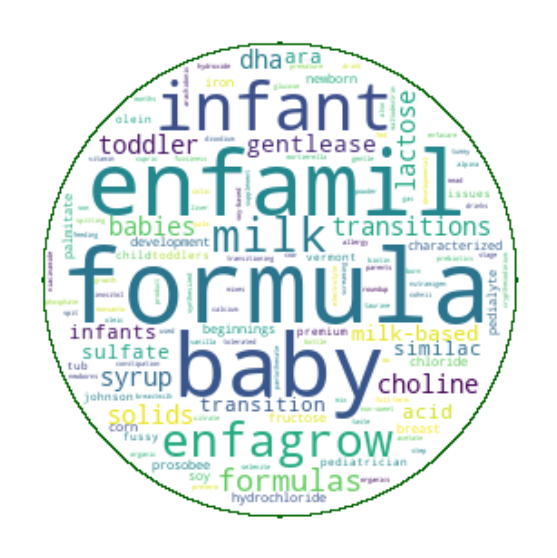

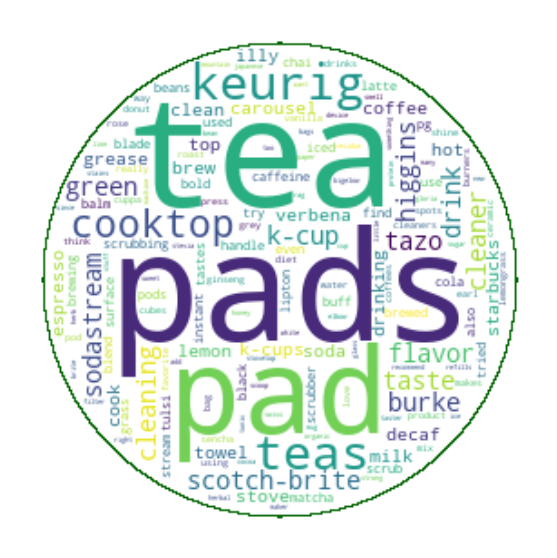

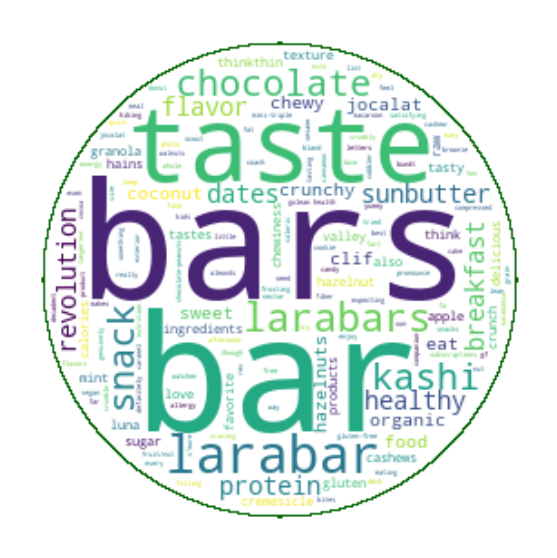

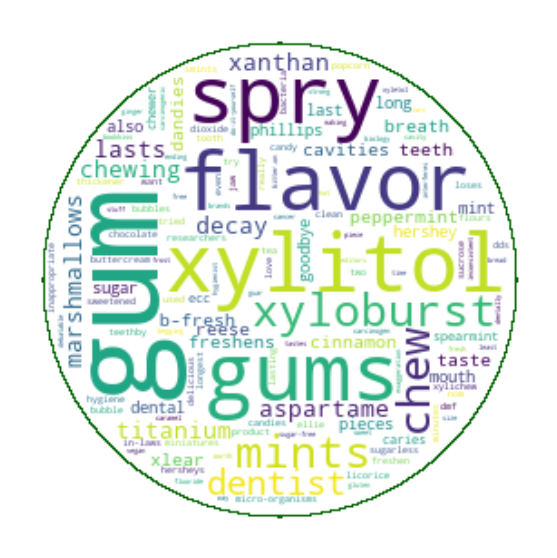

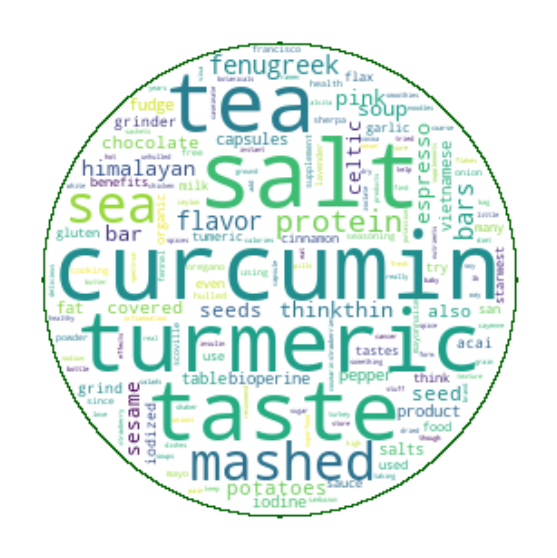

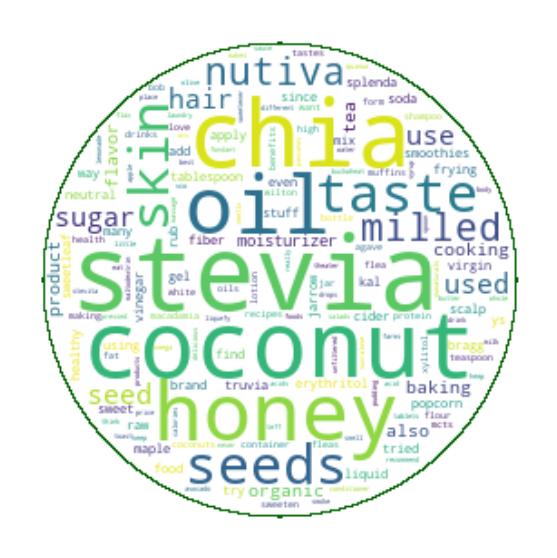

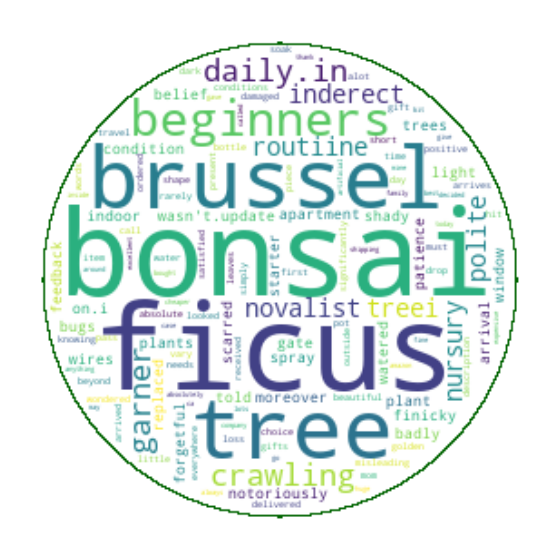

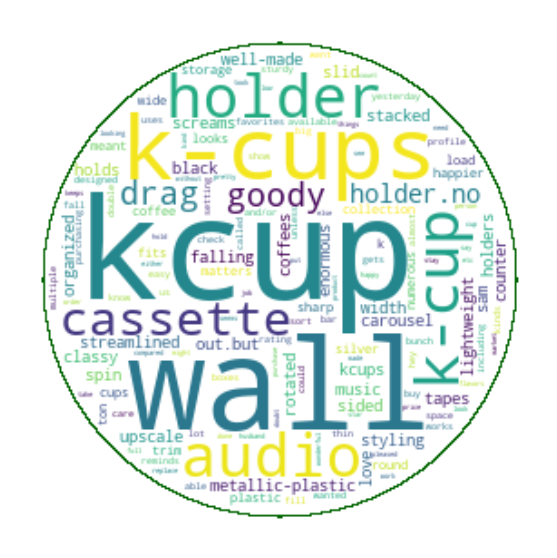

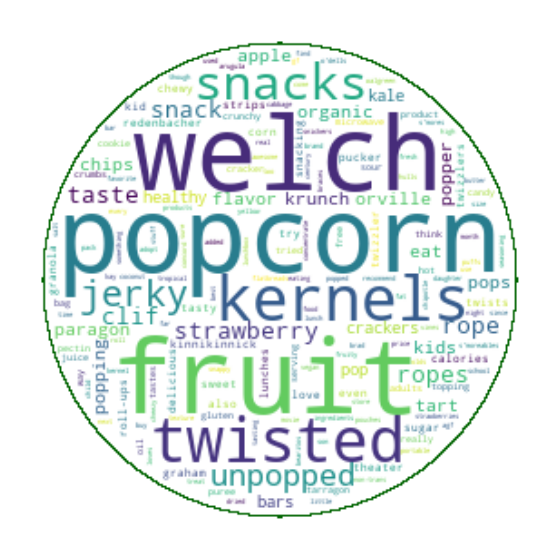

In [197]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

x, y = np.ogrid[:300, :300]

mask = (x - 150) ** 2 + (y - 150) ** 2 > 130 ** 2
mask = 255 * mask.astype(int)
wc = WordCloud(background_color="white", repeat=True, mask=mask)

for key in cat_dict.keys():
    unique_terms = np.unique(cat_dict[key])
    TF_IDF = {}
    a = dict(Counter(cat_dict[key],sorted=True))

    for t in unique_terms:
        if t in IDF_df.index:
            tf = a[t]/len(cat_dict[key])
            TF_IDF[t] = IDF_df['IDF'][t] * tf
    
    # make wordcloud from TF-IDF
    wordcloud = wc.generate_from_frequencies(TF_IDF)
    plt.figure(figsize=(10,10))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.show()

In [225]:
from os import path
from PIL import Image
import os

### Prøver med et billede fra Wordcloud, men kan ikke få det til at virke :((

# get data directory (using getcwd() is needed to support running example in generated IPython notebook)
d = path.dirname(__file__) if "__file__" in locals() else os.getcwd()

# read the mask image
# taken from
# http://www.stencilry.org/stencils/movies/alice%20in%20wonderland/255fk.jpg
plate_mask = np.array(Image.open(path.join(d, "data","wine.png")))

plate_mask = plate_mask[:,:,0]
plate_mask = plate_mask-255
plate_mask *= -1

UFuncTypeError: Cannot cast ufunc 'multiply' output from dtype('int16') to dtype('uint8') with casting rule 'same_kind'

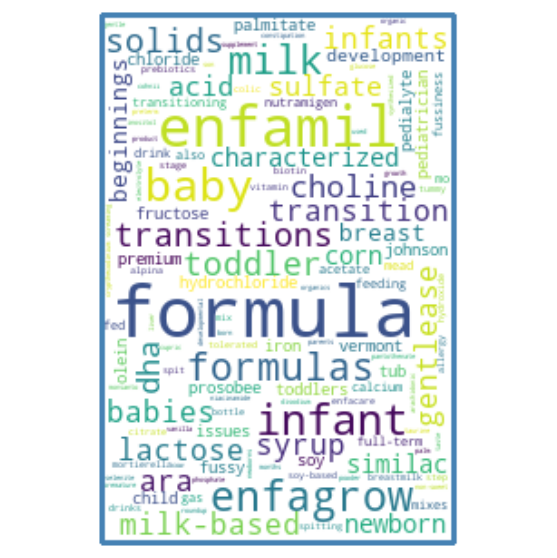

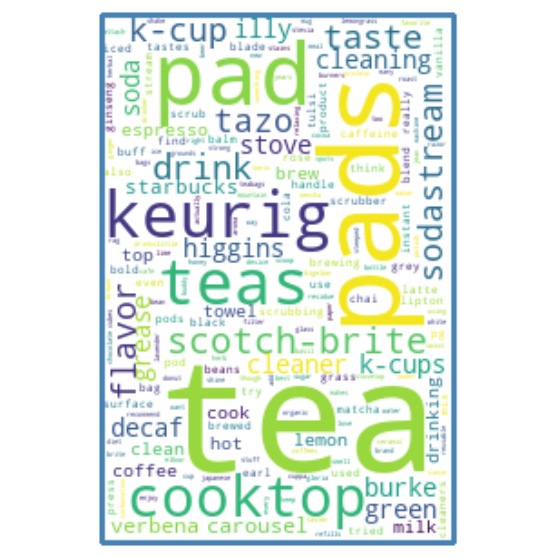

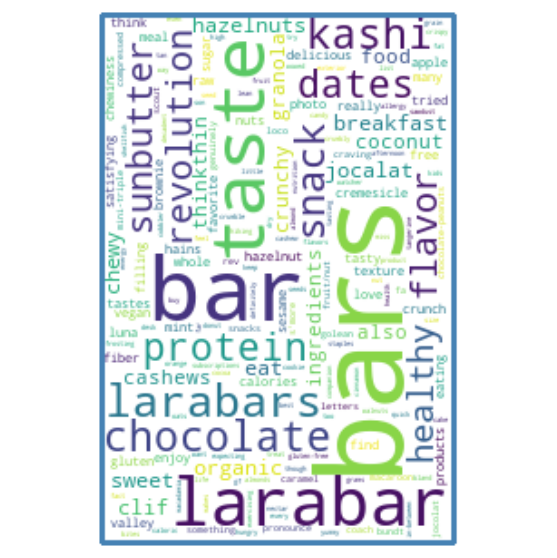

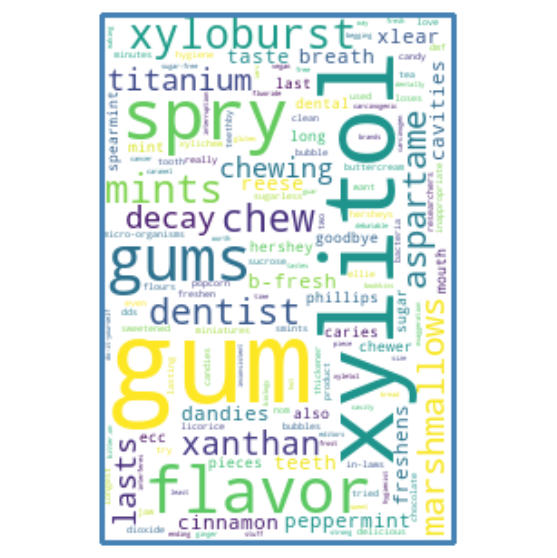

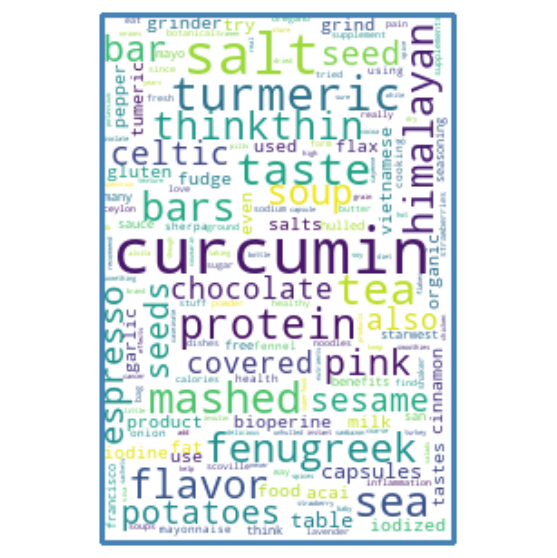

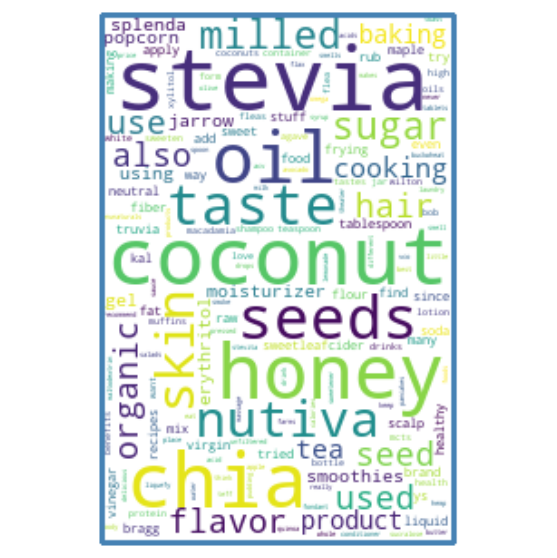

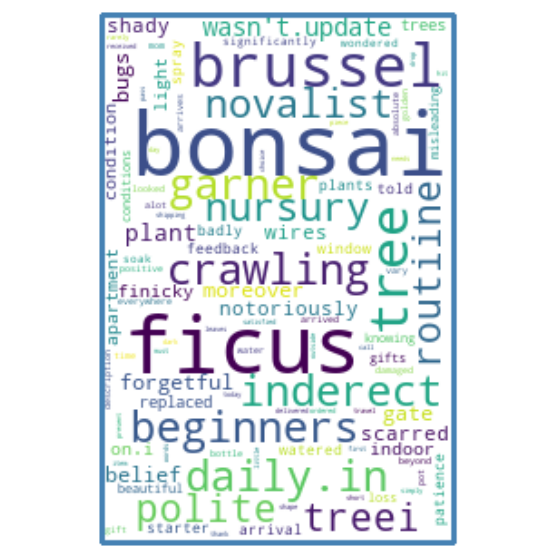

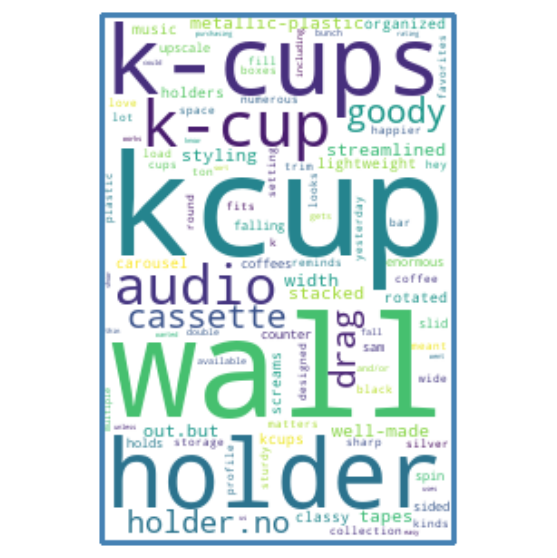

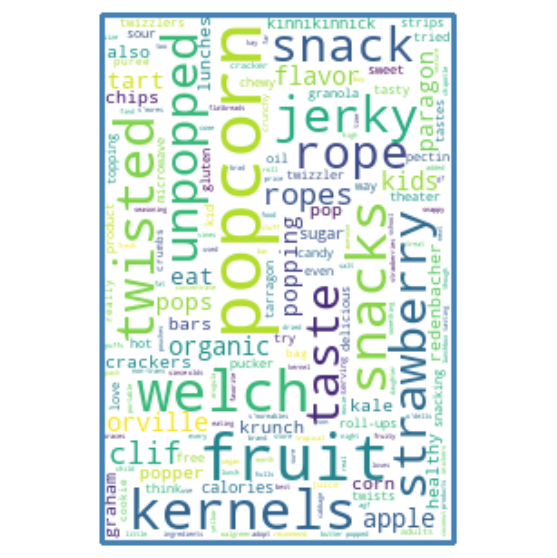

In [222]:
wc = WordCloud(background_color="white", mask=plate_mask, contour_width=1, contour_color='steelblue')


for key in cat_dict.keys():
    unique_terms = np.unique(cat_dict[key])
    TF_IDF = {}
    a = dict(Counter(cat_dict[key],sorted=True))

    for t in unique_terms:
        if t in IDF_df.index:
            tf = a[t]/len(cat_dict[key])
            TF_IDF[t] = IDF_df['IDF'][t] * tf
    
    # make wordcloud from TF-IDF
    wordcloud = wc.generate_from_frequencies(TF_IDF)
    plt.figure(figsize=(10,10))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.show()